In [1]:
# 라이브러리 import
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import re
from datetime import datetime

c:\Users\oh\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
c:\Users\oh\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# 데이터 로드

In [2]:
import os
os.chdir("C:/Users/oh/Desktop/project/e-cummerce_project/e-cormerce_project/")
os.getcwd()

import pandas as pd

customer_df = pd.read_csv('customer-9968.csv', sep=",")
order_df = pd.read_csv('order-9968.txt', sep=",")
user_df = pd.read_csv('user-9968.csv', sep=",")

refund_df = pd.read_csv('refund-9968.csv', sep=",")
course_df = pd.read_csv('course-9968.csv', sep=",")

In [3]:
order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284035 entries, 0 to 284034
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   id              284035 non-null  int64 
 1   type            284035 non-null  object
 2   state           284035 non-null  object
 3   name            284035 non-null  object
 4   created_at      284035 non-null  object
 5   updated_at      284035 non-null  object
 6   customer_id     284035 non-null  int64 
 7   list_price      284035 non-null  int64 
 8   sale_price      284035 non-null  int64 
 9   discount_price  284035 non-null  int64 
 10  tax_free_price  284035 non-null  int64 
dtypes: int64(6), object(5)
memory usage: 23.8+ MB


In [4]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123013 entries, 0 to 123012
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id          123013 non-null  int64 
 1   type        123013 non-null  object
 2   state       123013 non-null  object
 3   created_at  123013 non-null  object
 4   updated_at  123013 non-null  object
 5   user_id     123013 non-null  int64 
 6   name        123013 non-null  object
 7   phone       123013 non-null  int64 
 8   email       123013 non-null  object
dtypes: int64(3), object(6)
memory usage: 8.4+ MB


In [5]:
user_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122989 entries, 0 to 122988
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             122989 non-null  int64 
 1   type           122989 non-null  object
 2   state          122989 non-null  object
 3   created_at     122989 non-null  object
 4   updated_at     122989 non-null  object
 5   last_login_at  122989 non-null  object
 6   username       122988 non-null  object
dtypes: int64(1), object(6)
memory usage: 6.6+ MB


In [6]:
refund_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12674 entries, 0 to 12673
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               12674 non-null  int64  
 1   type             12674 non-null  object 
 2   state            12674 non-null  object 
 3   created_at       12674 non-null  object 
 4   updated_at       12674 non-null  object 
 5   user_id          12659 non-null  float64
 6   course_id        12075 non-null  float64
 7   amount           12674 non-null  int64  
 8   tax_free_amount  12674 non-null  int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 891.3+ KB


In [7]:
course_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722 entries, 0 to 721
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 722 non-null    int64  
 1   type               722 non-null    object 
 2   state              722 non-null    object 
 3   created_at         722 non-null    object 
 4   updated_at         722 non-null    object 
 5   title              722 non-null    object 
 6   description        554 non-null    object 
 7   close_at           15 non-null     object 
 8   total_class_hours  578 non-null    float64
 9   keywords           540 non-null    object 
dtypes: float64(1), int64(1), object(8)
memory usage: 56.5+ KB


In [8]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 폰트 경로 설정
font_path = 'c:/USERS/OH/APPDATA/LOCAL/MICROSOFT/WINDOWS/FONTS/D2CODING-VER1.3.2-20180524-ALL_0.TTC'

# 폰트 이름 가져오기
font_name = fm.FontProperties(fname=font_path).get_name()

# Matplotlib의 폰트를 설정
plt.rc('font', family=font_name)

# 폰트 설정
plt.rcParams['font.family'] = font_name

# 마이너스 기호도 정상적으로 표시되도록 설정
plt.rcParams['axes.unicode_minus'] = False

# 데이터 전처리

## datetime 변환

In [9]:
# order_date 컬럼에 저장된 데이터 형식을 %Y/%m/%d 에서 %Y-%m-%d로 변환
def object_to_datetime(date_str):
    date_obj = datetime.strptime(date_str, '%Y/%m/%d')
    new_date_str = date_obj.strftime('%Y-%m-%d')
    return new_date_str

In [10]:
order_df['updated_at'] = pd.to_datetime(order_df['updated_at'])
order_df['created_at'] = pd.to_datetime(order_df['created_at'])

In [11]:
customer_df

,id,type,state,created_at,updated_at,user_id,name,phone,email
0,1482394,USER,NORMAL,1/24/2024 4:44,1/24/2024 13:54,959919,USER_1482394,1012345678,USER_1482394@notexistemail.com
1,1482300,USER,NORMAL,1/24/2024 4:43,1/25/2024 6:10,818301,USER_1482300,1012345678,USER_1482300@notexistemail.com
2,1482071,USER,NORMAL,1/24/2024 4:41,1/25/2024 7:46,543671,USER_1482071,1012345678,USER_1482071@notexistemail.com
3,1445268,USER,NORMAL,12/27/2023 4:17,12/27/2023 4:17,824733,USER_1445268,1012345678,USER_1445268@notexistemail.com
4,1445150,USER,NORMAL,12/27/2023 4:15,12/27/2023 4:15,767404,USER_1445150,1012345678,USER_1445150@notexistemail.com
...,...,...,...,...,...,...,...,...,...
123008,86,USER,NORMAL,2/21/2019 22:01,10/3/2022 4:25,110484,USER_86,1012345678,USER_86@notexistemail.com
123009,56,USER,NORMAL,2/20/2019 11:38,3/1/2023 9:35,55759,USER_56,1012345678,USER_56@notexistemail.com
123010,52,USER,NORMAL,2/20/2019 7:42,9/2/2022 1:15,133140,USER_52,1012345678,USER_52@notexistemail.com
123011,46,USER,NORMAL,2/20/2019 3:05,5/2/2021 11:25,56787,USER_46,1012345678,USER_46@notexistemail.com


In [12]:
user_df

,id,type,state,created_at,updated_at,last_login_at,username
0,1075089,USER,NORMAL,2022-12-31 23:39:19,2023-12-02 00:00:22,2022-12-31 23:44:35,dkfk
1,1075079,USER,NORMAL,2022-12-31 23:08:47,2023-12-03 23:34:39,2023-12-03 23:34:40,toqu
2,1075074,USER,NORMAL,2022-12-31 22:46:31,2023-10-19 11:49:10,2023-10-19 11:49:10,theh
3,1075064,USER,NORMAL,2022-12-31 22:03:14,2023-10-06 18:20:51,2023-10-06 18:20:51,tige
4,1075059,USER,NORMAL,2022-12-31 21:35:42,2023-02-17 01:54:52,2023-02-17 01:54:52,kyg6
...,...,...,...,...,...,...,...
122984,20,USER,NORMAL,2019-08-19 02:02:33,2024-01-25 02:52:29,2024-01-25 02:52:29,jhki
122985,18,USER,NORMAL,2019-08-19 01:57:00,2022-08-10 23:17:50,2022-08-10 23:17:50,smki
122986,15,USER,NORMAL,2019-07-03 07:19:53,2024-01-10 06:03:52,2024-01-10 06:03:52,nkle
122987,14,USER,NORMAL,2019-07-03 05:42:07,2024-01-25 14:40:44,2024-01-25 14:40:44,jmki


## 데이터 조인

In [13]:
# 유저의 데이터를 하나로 합침

In [14]:
merge_person_df = pd.merge(customer_df,user_df, how='left', left_on='user_id', right_on='id')
merge_person_df

,id_x,type_x,state_x,created_at_x,updated_at_x,user_id,name,phone,email,id_y,type_y,state_y,created_at_y,updated_at_y,last_login_at,username
0,1482394,USER,NORMAL,1/24/2024 4:44,1/24/2024 13:54,959919,USER_1482394,1012345678,USER_1482394@notexistemail.com,959919,USER,NORMAL,2022-08-29 01:09:34,2024-01-24 14:02:36,2024-01-24 14:02:36,q020
1,1482300,USER,NORMAL,1/24/2024 4:43,1/25/2024 6:10,818301,USER_1482300,1012345678,USER_1482300@notexistemail.com,818301,USER,NORMAL,2022-03-14 06:28:52,2024-01-25 06:12:47,2024-01-25 06:12:48,suhy
2,1482071,USER,NORMAL,1/24/2024 4:41,1/25/2024 7:46,543671,USER_1482071,1012345678,USER_1482071@notexistemail.com,543671,USER,NORMAL,2021-06-07 02:01:19,2024-01-25 07:47:04,2024-01-25 07:47:04,tndu
3,1445268,USER,NORMAL,12/27/2023 4:17,12/27/2023 4:17,824733,USER_1445268,1012345678,USER_1445268@notexistemail.com,824733,USER,NORMAL,2022-03-22 07:10:09,2024-01-21 22:51:03,2024-01-21 22:51:03,minn
4,1445150,USER,NORMAL,12/27/2023 4:15,12/27/2023 4:15,767404,USER_1445150,1012345678,USER_1445150@notexistemail.com,767404,USER,NORMAL,2022-01-18 12:21:33,2024-01-25 13:25:45,2024-01-25 13:25:45,je11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123008,86,USER,NORMAL,2/21/2019 22:01,10/3/2022 4:25,110484,USER_86,1012345678,USER_86@notexistemail.com,110484,USER,NORMAL,2020-06-25 01:40:27,2024-01-09 08:23:12,2024-01-09 08:23:13,pite
123009,56,USER,NORMAL,2/20/2019 11:38,3/1/2023 9:35,55759,USER_56,1012345678,USER_56@notexistemail.com,55759,USER,NORMAL,2020-02-06 10:31:26,2023-08-16 11:58:18,2023-08-16 11:58:18,sosm
123010,52,USER,NORMAL,2/20/2019 7:42,9/2/2022 1:15,133140,USER_52,1012345678,USER_52@notexistemail.com,133140,USER,NORMAL,2020-08-18 08:02:35,2023-05-31 01:19:08,2023-05-31 01:19:08,ysk@
123011,46,USER,NORMAL,2/20/2019 3:05,5/2/2021 11:25,56787,USER_46,1012345678,USER_46@notexistemail.com,56787,USER,NORMAL,2020-02-06 13:15:45,2023-11-15 05:30:05,2023-11-15 05:30:05,effe


In [15]:
df = pd.merge(order_df, merge_person_df, how='left', left_on='customer_id',right_on='id_x')
df[['list_price','sale_price','discount_price']]
a = df['list_price'] - df['sale_price']
len(a[a!=df['discount_price']])

75524

In [16]:
df

,id,type,state,name_x,created_at,updated_at,customer_id,list_price,sale_price,discount_price,...,name_y,phone,email,id_y,type_y,state_y,created_at_y,updated_at_y,last_login_at,username
0,1600585,ORDER,COMPLETED,[30일 수강] 엑,2022-12-31 23:42:49,2022-12-31 23:42:52,1083679,10000,0,10000,...,USER_1083679,1.012346e+09,USER_1083679@notexistemail.com,1075089.0,USER,NORMAL,2022-12-31 23:39:19,2023-12-02 00:00:22,2022-12-31 23:44:35,dkfk
1,1600580,ORDER,COMPLETED,한번에 끝내는 재무,2022-12-31 23:39:01,2022-12-31 23:39:25,129176,40000,40000,0,...,USER_129176,1.012346e+09,USER_129176@notexistemail.com,115164.0,USER,NORMAL,2020-07-06 04:01:53,2024-01-18 23:52:25,2024-01-18 23:52:26,rmdw
2,1600579,ORDER,COMPLETED,네오아카데미 : 까,2022-12-31 23:38:31,2022-12-31 23:39:17,1072552,20000,10000,10000,...,USER_1072552,1.012346e+09,USER_1072552@notexistemail.com,1063801.0,USER,NORMAL,2022-12-25 05:57:06,2024-01-07 03:03:36,2024-01-07 03:03:37,luti
3,1600577,ORDER,COMPLETED,백엔드 개발자를 위,2022-12-31 23:35:52,2022-12-31 23:36:09,1083664,20000,20000,10000,...,USER_1083664,1.012346e+09,USER_1083664@notexistemail.com,1075074.0,USER,NORMAL,2022-12-31 22:46:31,2023-10-19 11:49:10,2023-10-19 11:49:10,theh
4,1600574,ORDER,COMPLETED,React Nati,2022-12-31 23:30:51,2022-12-31 23:31:13,1033553,20000,20000,0,...,USER_1033553,1.012346e+09,USER_1033553@notexistemail.com,1024503.0,USER,NORMAL,2022-11-16 19:14:48,2024-01-16 06:51:27,2024-01-16 06:51:28,help
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284030,773397,ORDER,COMPLETED,한 번에 끝내는 딥,2022-01-01 00:18:42,2022-01-01 00:18:44,753996,30000,0,30000,...,USER_753996,1.012346e+09,USER_753996@notexistemail.com,743883.0,USER,NORMAL,2021-12-30 03:29:36,2023-09-24 04:08:40,2023-09-24 04:08:40,glom
284031,773396,ORDER,COMPLETED,초격차 패키지 :,2022-01-01 00:18:33,2022-01-01 00:18:57,12693,30000,30000,0,...,USER_12693,1.012346e+09,USER_12693@notexistemail.com,19542.0,USER,NORMAL,2019-11-12 10:35:11,2024-01-24 22:50:23,2024-01-24 22:50:23,huni
284032,773394,ORDER,CANCELLED,한 번에 끝내는 딥,2022-01-01 00:17:19,2022-01-01 00:17:29,753996,30000,30000,0,...,USER_753996,1.012346e+09,USER_753996@notexistemail.com,743883.0,USER,NORMAL,2021-12-30 03:29:36,2023-09-24 04:08:40,2023-09-24 04:08:40,glom
284033,773392,ORDER,PENDING,초격차 패키지 :,2022-01-01 00:13:43,2022-01-01 00:13:43,12693,30000,30000,0,...,USER_12693,1.012346e+09,USER_12693@notexistemail.com,19542.0,USER,NORMAL,2019-11-12 10:35:11,2024-01-24 22:50:23,2024-01-24 22:50:23,huni


### 상수 컬럼 제거

In [17]:
df['type_y'].value_counts()

type_y
USER    283939
Name: count, dtype: int64

In [18]:
df['type'].value_counts()

type
ORDER    284035
Name: count, dtype: int64

In [19]:
df = df.drop(['type', 'type_y','type_x'], axis=1)

### 중복 컬럼 제거

In [20]:
df = df.drop(['id_y','id_x','created_at_x'], axis=1)

### 분석에 필요 없는 컬럼 제거

In [21]:
df = df.drop(['name_y','phone','email','username'], axis=1)

state_x와 state_y는 다르다

### 컬럼명 변경

In [22]:
# 컬럼 이름 변경
df.rename(columns={'id': 'order_id', 'state': 'order_state','name_x':'title','created_at':'결제시작','updated_at':'결제완료','state_x':'customer_state',
                    'updated_at_x': '최근 결제일', 'state_y':'user_state','updated_at_y':'개인정보 수정일', 'created_at_y' : '계정 생성 날짜'}, inplace=True)

In [23]:
# 컬럼의 데이터 타입을 datetime으로 변환
df['개인정보 수정일'] = pd.to_datetime(df['개인정보 수정일'])
df['last_login_at'] = pd.to_datetime(df['last_login_at'])

In [24]:
# 두 컬럼 중 더 큰 값을 찾아 'last_login_at'에 저장
df['last_login_at'] = np.maximum(df['개인정보 수정일'], df['last_login_at'])
df = df.drop('개인정보 수정일', axis=1)


## 환불 데이터 전처리

### 조인

In [25]:
refund_df2 = pd.merge(refund_df, course_df, how='left', left_on='course_id',right_on='id')

In [26]:
refund_df2

,id_x,type_x,state_x,created_at_x,updated_at_x,user_id,course_id,amount,tax_free_amount,id_y,type_y,state_y,created_at_y,updated_at_y,title,description,close_at,total_class_hours,keywords
0,72124,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 7:29,2022-12-30 7:29,619833.0,214323.0,-20000,-20000,214323.0,COURSE,ONGOING,2022-11-24 9:18,2023-11-30 6:37,[쉐어엑스]플러스엑-214323,프로젝트 매니지먼트,NaN,10.0,"PLUSX\t, UXPACK\t, PROCESS\t, 플엑\t, 플러스엑스\t, u..."
1,72121,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 7:01,2022-12-30 7:01,146614.0,213905.0,-10000,-10000,213905.0,COURSE,ONGOING,2022-11-04 1:03,2023-11-20 1:36,초격차 패키지 : -213905,"21개 프로젝트,",NaN,85.0,"인터랙티브,웹개발,프로젝트,프론트엔드,frontend,HTML,자바스크립트,JAVA..."
2,72119,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 6:08,2022-12-30 6:08,541404.0,214402.0,0,0,214402.0,COURSE,ONGOING,2022-11-29 7:07,2023-11-29 9:02,빵형의 수학 없이 -214402,직접 AI 모델을,NaN,12.0,"인공지능,AI,머신러닝,인공지능기초,인공지능모델구현,인공지능왕초보,인공지능모델,인공..."
3,72117,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 6:00,2022-12-30 6:00,1056095.0,203935.0,-10000,-10000,203935.0,COURSE,HIDDEN,2020-12-29 5:16,2023-10-06 7:11,한 번에 끝내는 파-203935,파이썬 웹 개발+크,NaN,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b..."
4,72116,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 5:57,2022-12-30 5:57,98880.0,213244.0,-20000,-20000,213244.0,COURSE,ONGOING,2022-09-13 7:14,2023-11-20 0:40,30개 사례로 배우-213244,각 산업군마다 정의,NaN,62.0,"Anomalydetection,이상탐지,머신러닝,이상진단"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12669,44843,ADMIN_AUTO_REFUND,COMPLETED,2022-01-03 1:09,2022-01-03 1:09,710222.0,206848.0,-70000,-70000,206848.0,COURSE,HIDDEN,2021-08-04 5:45,2023-06-01 1:28,The RED : -206848,유튜브에 쓰이는 비,NaN,8.0,"추천시스템,콘텐츠기반필터링,영상인식,협업필터링,유튜브,알고리즘"
12670,44842,ADMIN_AUTO_REFUND,COMPLETED,2022-01-03 1:07,2022-01-03 1:07,723215.0,NaN,-70000,-70000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12671,44841,ADMIN_AUTO_REFUND,COMPLETED,2022-01-03 1:06,2022-01-03 1:06,744769.0,203720.0,-10000,-10000,203720.0,COURSE,ONGOING,2020-11-30 7:00,2023-11-20 1:36,한 번에 끝내는 프-203720,"프론트엔드 공부,",NaN,97.0,"FRONTEND,HTML,JS,자바스크립트,JAVASCRIPT,NODEJS,노드,T..."
12672,44840,ADMIN_AUTO_REFUND,COMPLETED,2022-01-03 1:05,2022-01-03 1:05,1345.0,204366.0,-10000,-10000,204366.0,COURSE,ONGOING,2021-03-18 7:29,2023-11-20 1:29,30개 글감으로 에-204366,베스트셀러 작가의,NaN,14.0,"평생소장,글쓰기,출판프로세스,베스트셀러작가,마케팅,카피라이팅,김영하,정영욱,OWOO..."


### 결측치 제거

In [27]:
# course_id 가 결측치이면 제거
refund_df2.dropna(subset=['course_id'], inplace=True)

### 변수(title 전처리)명 변경

In [28]:
# order_df의 제목들이 10글자 이고 맨뒤에 뛰어쓰기가 올 경우 9글자이기에 조인하기 위해 데이터 전처리
a = list(refund_df2['title'].values)
title_list = []
for i in a:
    # 맨뒤에 공백 제거
    if str(i)[9:10] == ' ':
        title_list.append(str(i)[:9])
    else:
        title_list.append(str(i)[:10])
refund_df2['title']=title_list

In [29]:
refund_df2.head()

,id_x,type_x,state_x,created_at_x,updated_at_x,user_id,course_id,amount,tax_free_amount,id_y,type_y,state_y,created_at_y,updated_at_y,title,description,close_at,total_class_hours,keywords
0,72124,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 7:29,2022-12-30 7:29,619833.0,214323.0,-20000,-20000,214323.0,COURSE,ONGOING,2022-11-24 9:18,2023-11-30 6:37,[쉐어엑스]플러스엑,프로젝트 매니지먼트,NaN,10.0,"PLUSX\t, UXPACK\t, PROCESS\t, 플엑\t, 플러스엑스\t, u..."
1,72121,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 7:01,2022-12-30 7:01,146614.0,213905.0,-10000,-10000,213905.0,COURSE,ONGOING,2022-11-04 1:03,2023-11-20 1:36,초격차 패키지 :,"21개 프로젝트,",NaN,85.0,"인터랙티브,웹개발,프로젝트,프론트엔드,frontend,HTML,자바스크립트,JAVA..."
2,72119,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 6:08,2022-12-30 6:08,541404.0,214402.0,0,0,214402.0,COURSE,ONGOING,2022-11-29 7:07,2023-11-29 9:02,빵형의 수학 없이,직접 AI 모델을,NaN,12.0,"인공지능,AI,머신러닝,인공지능기초,인공지능모델구현,인공지능왕초보,인공지능모델,인공..."
3,72117,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 6:00,2022-12-30 6:00,1056095.0,203935.0,-10000,-10000,203935.0,COURSE,HIDDEN,2020-12-29 5:16,2023-10-06 7:11,한 번에 끝내는 파,파이썬 웹 개발+크,NaN,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b..."
4,72116,ADMIN_AUTO_REFUND,COMPLETED,2022-12-30 5:57,2022-12-30 5:57,98880.0,213244.0,-20000,-20000,213244.0,COURSE,ONGOING,2022-09-13 7:14,2023-11-20 0:40,30개 사례로 배우,각 산업군마다 정의,NaN,62.0,"Anomalydetection,이상탐지,머신러닝,이상진단"


In [30]:
refund_df2['close_at'].value_counts()

close_at
2022-09-15 14:59    4
2023-01-17 15:00    3
2022-03-04 15:00    3
2023-01-25 15:00    2
2023-01-06 14:59    2
2023-02-06 15:00    1
2023-03-06 15:00    1
Name: count, dtype: int64

### 컬럼 전처리

In [31]:
# 상수항과 중복 컬럼 제거
refund_df2.drop(['state_x', 'type_x','created_at_x','id_y'], axis=1, inplace=True)

In [32]:
# order_df의 제목들이 10글자 이고 맨뒤에 뛰어쓰기가 올 경우 9글자이기에 조인하기 위해 데이터 전처리
a = list(refund_df2['title'].values)
title_list = []
for i in a:
    # 맨뒤에 공백 제거
    if str(i)[9:10] == ' ':
        title_list.append(str(i)[:9])
    else:
        title_list.append(str(i)[:10])
refund_df2['title']=title_list

In [33]:
len(course_df)

722

In [34]:
df = df.drop(['tax_free_price','customer_state','user_state','결제시작'], axis=1)

In [35]:
# 컬럼 이름 변경
df.rename(columns={'list_price': '수업금액', 'last_login_at': '최근 접속일','discount_price':'할인'}, inplace=True)

In [36]:
refund_df2 = refund_df2.drop(['tax_free_amount','updated_at_y','type_y','state_y','description','close_at'], axis=1)

In [37]:
refund_df2['환불금액'] = -refund_df2['amount']

In [38]:
# 컬럼 이름 변경
refund_df2.rename(columns={'id_x': 'refund_id', 'updated_at_x': '환불시간','created_at_y':'강의생성시간','total_class_hours':'수업시간','keywords':'키워드'}, inplace=True)

In [39]:
refund_df2

,refund_id,환불시간,user_id,course_id,amount,강의생성시간,title,수업시간,키워드,환불금액
0,72124,2022-12-30 7:29,619833.0,214323.0,-20000,2022-11-24 9:18,[쉐어엑스]플러스엑,10.0,"PLUSX\t, UXPACK\t, PROCESS\t, 플엑\t, 플러스엑스\t, u...",20000
1,72121,2022-12-30 7:01,146614.0,213905.0,-10000,2022-11-04 1:03,초격차 패키지 :,85.0,"인터랙티브,웹개발,프로젝트,프론트엔드,frontend,HTML,자바스크립트,JAVA...",10000
2,72119,2022-12-30 6:08,541404.0,214402.0,0,2022-11-29 7:07,빵형의 수학 없이,12.0,"인공지능,AI,머신러닝,인공지능기초,인공지능모델구현,인공지능왕초보,인공지능모델,인공...",0
3,72117,2022-12-30 6:00,1056095.0,203935.0,-10000,2020-12-29 5:16,한 번에 끝내는 파,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b...",10000
4,72116,2022-12-30 5:57,98880.0,213244.0,-20000,2022-09-13 7:14,30개 사례로 배우,62.0,"Anomalydetection,이상탐지,머신러닝,이상진단",20000
...,...,...,...,...,...,...,...,...,...,...
12668,44844,2022-01-03 1:10,741497.0,209093.0,0,2021-12-06 7:54,배곡파 작가의 웹소,21.0,"웹소설,BL,남자,일러스트,실사,실사풍,드로잉,글레이징,포토샵,타블렛,해부학,도형화...",0
12669,44843,2022-01-03 1:09,710222.0,206848.0,-70000,2021-08-04 5:45,The RED :,8.0,"추천시스템,콘텐츠기반필터링,영상인식,협업필터링,유튜브,알고리즘",70000
12671,44841,2022-01-03 1:06,744769.0,203720.0,-10000,2020-11-30 7:00,한 번에 끝내는 프,97.0,"FRONTEND,HTML,JS,자바스크립트,JAVASCRIPT,NODEJS,노드,T...",10000
12672,44840,2022-01-03 1:05,1345.0,204366.0,-10000,2021-03-18 7:29,30개 글감으로 에,14.0,"평생소장,글쓰기,출판프로세스,베스트셀러작가,마케팅,카피라이팅,김영하,정영욱,OWOO...",10000


## 모든 데이터를 합친 데이터셋

In [40]:
# 'user_id'와 'title' 컬럼이 일치하는 행끼리 조인
joined_df = pd.merge( refund_df2,df, on=['user_id', 'title'], how='inner')

In [41]:
# 시간 데이터를 datetime 타입으로 변환
joined_df['결제완료'] = pd.to_datetime(joined_df['결제완료'])
joined_df['환불시간'] = pd.to_datetime(joined_df['환불시간'])

# '결제완료' 시간이 '환불시간'보다 이후인 행을 식별
condition = joined_df['결제완료'] > joined_df['환불시간']

# 조건을 만족하지 않는 행만 필터링하여 새로운 DataFrame 생성
refund_df = joined_df[~condition]
refund_df

,refund_id,환불시간,user_id,course_id,amount,강의생성시간,title,수업시간,키워드,환불금액,order_id,order_state,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,계정 생성 날짜,최근 접속일
0,72117,2022-12-30 06:00:00,1056095.0,203935.0,-10000,2020-12-29 5:16,한 번에 끝내는 파,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b...",10000,1550146,COMPLETED,2022-12-18 12:57:19,1065025,30000,20000,10000,12/18/2022 12:59,2022-12-18 07:57:07,2023-11-29 03:00:26
1,72117,2022-12-30 06:00:00,1056095.0,203935.0,-10000,2020-12-29 5:16,한 번에 끝내는 파,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b...",10000,1550105,CANCELLED,2022-12-18 12:47:04,1065025,30000,20000,10000,12/18/2022 12:59,2022-12-18 07:57:07,2023-11-29 03:00:26
3,72111,2022-12-30 05:53:00,1072741.0,211087.0,-10000,2022-04-18 7:15,한 번에 끝내는 서,53.0,"PM,PO,서비스기획,기획포트폴리오,커리어,앱기획,ux/ui,ux,ui,역기획,프로...",10000,1592998,COMPLETED,2022-12-30 05:32:41,1081335,20000,20000,0,12/30/2022 5:31,2022-12-30 05:30:47,2024-01-24 01:00:14
4,72109,2022-12-30 05:40:00,1010380.0,208104.0,-10000,2021-10-20 11:19,100억을 움직이는,8.0,"평생소장,PPT디자인,업무생산성,PPT기획서,PPT,페이퍼로지,피피티,피피티디자인,...",10000,1591013,COMPLETED,2022-12-29 15:27:26,1019444,20000,20000,0,3/24/2023 12:31,2022-10-30 16:22:31,2023-12-14 14:51:19
5,72097,2022-12-30 04:41:00,1071731.0,212600.0,-20000,2022-07-27 10:23,네오아카데미 : 완,21.0,"네오아카데미,완케,빠른성장,캐주얼,일러스트,아트디렉터,그림,드로잉,네오,포토샵,악마...",20000,1589324,COMPLETED,2022-12-29 09:24:08,1080332,30000,30000,0,12/29/2022 10:09,2022-12-29 09:15:53,2023-12-03 12:00:25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11430,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774345,PENDING,2022-01-01 23:19:11,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11431,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774342,CANCELLED,2022-01-01 23:17:05,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11432,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774339,CANCELLED,2022-01-01 23:07:21,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11433,44859,2022-01-03 01:28:00,747691.0,203499.0,-10000,2020-10-26 9:51,100억을 움직이는,8.0,"평생소장,PPT기획서,업무 생산성,PPT,보고서,페이퍼로지,피피티,PPT강의,피피티...",10000,774529,COMPLETED,2022-01-02 03:00:31,757801,20000,20000,10000,3/7/2023 2:36,2022-01-02 02:57:07,2023-05-20 23:38:17


In [42]:
# order_df의 제목들이 10글자 이고 맨뒤에 뛰어쓰기가 올 경우 9글자이기에 조인하기 위해 데이터 전처리
a = list(course_df['title'].values)
title_list = []
for i in a:
    # 맨뒤에 공백 제거
    if str(i)[9:10] == ' ':
        title_list.append(str(i)[:9])
    else:
        title_list.append(str(i)[:10])
course_df['title']=title_list

In [43]:
course_df = course_df.drop(['type','state','updated_at','close_at'], axis=1)

In [44]:
course_df

,id,created_at,title,description,total_class_hours,keywords
0,214903,2022-12-27 1:33,(B2G) K-Di,NaN,NaN,NaN
1,214898,2022-12-26 12:25,(B2G) K-Di,NaN,NaN,NaN
2,214897,2022-12-26 12:20,(B2G) K-Di,NaN,NaN,NaN
3,214896,2022-12-26 12:17,(B2G) K-Di,NaN,NaN,NaN
4,214895,2022-12-26 12:14,(B2G) K-Di,NaN,NaN,NaN
...,...,...,...,...,...,...
717,200260,2019-02-20 2:01,스타트업 투자유치&,"베테랑 VC, 패스",4.0,"스타트업,벤처투자,부동산,금융,금융/ 투자 실무,vc 취업,벤처캐피탈 취업,벤처캐피..."
718,200167,2019-01-31 1:15,1인 쇼핑몰 시작하,상품소싱부터 쇼핑몰,31.0,"평생소장,쇼핑몰구축,쇼핑몰운영"
719,2600,2018-10-30 21:55,앱/웹 서비스 기획,서비스 기획의 실무,20.0,"평생소장,전체오픈,서비스기획"
720,2204,2018-07-11 4:24,디자인 툴 올인원,디자인에 필요한 모,NaN,"평생소장,디자인,어도비,그래픽,영상,스케치,프로토타이핑"


## 주문데이터에 강의 데이터 조인

In [45]:
# 'title' 컬럼이 일치하는 행끼리 조인
joined_df = pd.merge( df,course_df, on=['title'], how='inner')

### datetime 전처리

In [46]:
# 시간 데이터를 datetime 타입으로 변환
joined_df['결제완료'] = pd.to_datetime(joined_df['결제완료'])
joined_df['created_at'] = pd.to_datetime(joined_df['created_at'])

# '결제완료' 시간이 'created_at'보다 이전인 행을 식별
condition = joined_df['결제완료'] < joined_df['created_at']

# 조건을 만족하지 않는 행만 필터링하여 새로운 DataFrame 생성
total_df = joined_df[~condition]

### 이상치 전처리

In [47]:
len(total_df[total_df['결제완료'].dt.year != 2022])

5

In [48]:
# 2022년도가 아닌 데이터 삭제
total_df = total_df[total_df['결제완료'].dt.year == 2022]

### 중복데이터 처리

In [49]:
# 'order_id'에 대한 각 고유 값의 출현 빈도 계산
order_id_counts = total_df['order_id'].value_counts()

# 출현 빈도가 1번 이상인 경우만 필터링
filtered_order_ids = order_id_counts[order_id_counts > 3]

# 필터링된 결과 출력
print(filtered_order_ids)

order_id
1584021    75
1582561    75
1579766    75
1581699    75
1581826    75
           ..
881841      4
1094025     4
792999      4
1442814     4
1538232     4
Name: count, Length: 9543, dtype: int64


In [50]:
total_df[total_df['order_id']==1587788]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
3667,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,213080,2022-08-25 04:06:00,온라인 최초공개 C,11.0,"권오상,재무제표,기업분석,M&A,IPO,부동산,금융,회계,재무,세무,권오상회계강의"
3668,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,211744,2022-06-02 03:43:00,온라인 최초공개 C,27.0,"권오상,내부회계관리제도,내부통제,회계,금융,실무,금융아카데미,실무형회계,이사회감사보..."
3669,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,208324,2021-11-02 08:53:00,온라인 최초공개 C,24.0,"권오상회계사,M&A,재무제표,인수합병,권오상회계강의,금융아카데미,합병,분할,재무실사..."
3670,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,205423,2021-05-22 02:36:00,온라인 최초공개 C,19.0,"권오상회계사,자금조달,기업가치평가,부동산,금융,회계,재무,세무,금융아카데미,기업재무관리"
3671,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,205053,2021-04-22 06:17:00,온라인 최초공개 C,11.0,"권오상,재무제표,기업분석,M&A,IPO,부동산,금융,회계,재무,세무,권오상회계강의,..."
3672,1587788,COMPLETED,권오상의 금융 아카,2022-12-29 03:02:52,1073879,40000,40000,0,12/27/2022 7:06,1065176.0,2022-12-26 06:12:37,2023-08-17 06:38:16,203655,2020-11-11 07:52:00,온라인 최초공개 C,16.0,"재무제표,권오상회계사,심화,부동산,금융,회계,재무,세무,권오상회계강의,금융아카데미,..."


In [51]:
total_df[total_df['order_id']==1144015]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
159780,1144015,COMPLETED,한 번에 끝내는 컴,2022-06-26 14:06:13,706969,40000,30000,10000,9/14/2022 11:47,696724.0,2021-11-10 12:53:41,2023-12-14 06:00:24,210565,2022-03-10 01:52:00,이미지/영상처리 1,145.0,"컴퓨터비전,딥러닝,openCV,텐서플로우,파이토치,tensorflow,PyTorch..."
159781,1144015,COMPLETED,한 번에 끝내는 컴,2022-06-26 14:06:13,706969,40000,30000,10000,9/14/2022 11:47,696724.0,2021-11-10 12:53:41,2023-12-14 06:00:24,206060,2021-06-29 04:41:00,13과목의 컴퓨터,132.0,"평생소장,45학점,프로그래밍,개발자 커리어,132시간,컴공,컴퓨터공학,전공지식,이론..."


In [52]:
total_df[total_df['order_id']==1106495]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
169965,1106495,COMPLETED,김민태의 프론트엔드,2022-06-09 03:07:41,97730,20000,20000,10000,11/17/2023 16:38,82627.0,2020-04-05 08:39:58,2023-11-28 06:08:40,210127,2022-02-08 12:45:00,우아한형제들 기술이,15.0,"Frontend,주니어개발자,실무강의,실전대비,자바스크립트,Javascript,타입..."
169966,1106495,COMPLETED,김민태의 프론트엔드,2022-06-09 03:07:41,97730,20000,20000,10000,11/17/2023 16:38,82627.0,2020-04-05 08:39:58,2023-11-28 06:08:40,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
169967,1106495,COMPLETED,김민태의 프론트엔드,2022-06-09 03:07:41,97730,20000,20000,10000,11/17/2023 16:38,82627.0,2020-04-05 08:39:58,2023-11-28 06:08:40,203527,2020-10-30 05:30:00,우아한형제들 기술이,21.0,"자바스크립트,타입스크립트,프레임워크,웹앱,DENO,노드,NODEJS,NPM,HTML..."


In [53]:
total_df[total_df['order_id']==1136326]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
161799,1136326,COMPLETED,한 번에 끝내는 데,2022-06-23 08:46:24,742447,20000,0,20000,5/12/2023 8:01,732325.0,2021-12-20 01:06:13,2024-01-23 12:46:04,209597,2021-12-28 05:16:00,"Java, Pyth",120.0,"데이터엔지니어링,spark,데이터파이프라인,데이터웨어하우스,데이터프로세싱,데이터엔지..."
161800,1136326,COMPLETED,한 번에 끝내는 데,2022-06-23 08:46:24,742447,20000,0,20000,5/12/2023 8:01,732325.0,2021-12-20 01:06:13,2024-01-23 12:46:04,209022,2021-12-01 07:30:00,지저분한 RAW D,63.0,"데이터분석,엔지니어링,머신러닝,데이터 사이언스, 데이터사이언스, 데이터싸이언스, 캐..."
161801,1136326,COMPLETED,한 번에 끝내는 데,2022-06-23 08:46:24,742447,20000,0,20000,5/12/2023 8:01,732325.0,2021-12-20 01:06:13,2024-01-23 12:46:04,205548,2021-05-31 08:36:00,데이터 분석 핵심,80.0,"프로젝트,네카라쿠배,데이터사이언스,데이터분석,R,파이썬,SQL,데이터,논문리뷰,SO..."
161802,1136326,COMPLETED,한 번에 끝내는 데,2022-06-23 08:46:24,742447,20000,0,20000,5/12/2023 8:01,732325.0,2021-12-20 01:06:13,2024-01-23 12:46:04,203531,2020-10-30 05:43:00,7가지 데이터 분석,67.0,"데이터분석툴,실습,데이터사이언스,데이터분석,코딩,데이터 분석,데이터 사이언스,데이터..."


조인 결과 order_id가 중복되는 데이터들을 살펴보니

In [54]:
# 'order_id'에 대한 각 고유 값의 출현 빈도 계산
order_id_counts = total_df['order_id'].value_counts()

# 출현 빈도가 1번 이상인 경우만 필터링
filtered_order_ids = order_id_counts[order_id_counts == 1]

# 필터링된 결과 출력
print(filtered_order_ids)

order_id
1071985    1
795980     1
1086267    1
791510     1
1086256    1
          ..
1299960    1
1299995    1
1300018    1
1300061    1
773394     1
Name: count, Length: 104500, dtype: int64


In [55]:
course_df[course_df['title']=='김민태의 프론트엔드']

,id,created_at,title,description,total_class_hours,keywords
373,210127,2022-02-08 12:45,김민태의 프론트엔드,우아한형제들 기술이,15.0,"Frontend,주니어개발자,실무강의,실전대비,자바스크립트,Javascript,타입..."
522,206869,2021-08-05 13:37,김민태의 프론트엔드,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
643,203527,2020-10-30 5:30,김민태의 프론트엔드,우아한형제들 기술이,21.0,"자바스크립트,타입스크립트,프레임워크,웹앱,DENO,노드,NODEJS,NPM,HTML..."


In [56]:
total_df[(total_df['title']=='김민태의 프론트엔드')&(total_df['total_class_hours']==6)].sort_values('order_id')

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
258448,774965,COMPLETED,김민태의 프론트엔드,2022-01-02 09:08:07,758077,30000,20000,10000,1/2/2022 9:05,747967.0,2022-01-02 08:50:14,2023-07-30 13:19:00,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
258190,775566,COMPLETED,김민태의 프론트엔드,2022-01-02 16:06:10,201589,30000,20000,10000,7/2/2021 18:02,514741.0,2021-05-14 09:55:15,2023-03-07 07:29:08,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
258146,775651,COMPLETED,김민태의 프론트엔드,2022-01-02 17:37:11,409633,30000,10000,20000,11/19/2023 7:43,306605.0,2021-01-27 11:36:03,2023-12-26 03:19:08,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
258107,775739,COMPLETED,김민태의 프론트엔드,2022-01-02 21:31:59,547262,30000,10000,20000,7/20/2023 19:41,536912.0,2021-05-31 08:14:29,2023-07-27 02:20:21,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
258052,775798,COMPLETED,김민태의 프론트엔드,2022-01-02 22:57:57,477321,20000,0,20000,11/10/2022 17:50,373870.0,2021-03-27 06:36:42,2023-11-09 04:57:03,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1599892,COMPLETED,김민태의 프론트엔드,2022-12-31 14:42:40,404844,30000,30000,0,12/25/2022 8:30,301835.0,2021-01-22 22:46:26,2023-05-15 06:56:04,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
32,1600329,CANCELLED,김민태의 프론트엔드,2022-12-31 17:22:38,1083578,20000,20000,10000,4/11/2023 16:35,1074988.0,2022-12-31 17:20:33,2023-09-23 23:04:57,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
29,1600341,CANCELLED,김민태의 프론트엔드,2022-12-31 17:37:26,1083578,20000,20000,10000,4/11/2023 16:35,1074988.0,2022-12-31 17:20:33,2023-09-23 23:04:57,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
25,1600345,CANCELLED,김민태의 프론트엔드,2022-12-31 17:41:25,1083578,20000,20000,10000,4/11/2023 16:35,1074988.0,2022-12-31 17:20:33,2023-09-23 23:04:57,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."


In [57]:
refund_df

,refund_id,환불시간,user_id,course_id,amount,강의생성시간,title,수업시간,키워드,환불금액,order_id,order_state,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,계정 생성 날짜,최근 접속일
0,72117,2022-12-30 06:00:00,1056095.0,203935.0,-10000,2020-12-29 5:16,한 번에 끝내는 파,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b...",10000,1550146,COMPLETED,2022-12-18 12:57:19,1065025,30000,20000,10000,12/18/2022 12:59,2022-12-18 07:57:07,2023-11-29 03:00:26
1,72117,2022-12-30 06:00:00,1056095.0,203935.0,-10000,2020-12-29 5:16,한 번에 끝내는 파,80.0,"Django,FastAPI,Flask,백엔드,backend,python,html,b...",10000,1550105,CANCELLED,2022-12-18 12:47:04,1065025,30000,20000,10000,12/18/2022 12:59,2022-12-18 07:57:07,2023-11-29 03:00:26
3,72111,2022-12-30 05:53:00,1072741.0,211087.0,-10000,2022-04-18 7:15,한 번에 끝내는 서,53.0,"PM,PO,서비스기획,기획포트폴리오,커리어,앱기획,ux/ui,ux,ui,역기획,프로...",10000,1592998,COMPLETED,2022-12-30 05:32:41,1081335,20000,20000,0,12/30/2022 5:31,2022-12-30 05:30:47,2024-01-24 01:00:14
4,72109,2022-12-30 05:40:00,1010380.0,208104.0,-10000,2021-10-20 11:19,100억을 움직이는,8.0,"평생소장,PPT디자인,업무생산성,PPT기획서,PPT,페이퍼로지,피피티,피피티디자인,...",10000,1591013,COMPLETED,2022-12-29 15:27:26,1019444,20000,20000,0,3/24/2023 12:31,2022-10-30 16:22:31,2023-12-14 14:51:19
5,72097,2022-12-30 04:41:00,1071731.0,212600.0,-20000,2022-07-27 10:23,네오아카데미 : 완,21.0,"네오아카데미,완케,빠른성장,캐주얼,일러스트,아트디렉터,그림,드로잉,네오,포토샵,악마...",20000,1589324,COMPLETED,2022-12-29 09:24:08,1080332,30000,30000,0,12/29/2022 10:09,2022-12-29 09:15:53,2023-12-03 12:00:25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11430,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774345,PENDING,2022-01-01 23:19:11,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11431,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774342,CANCELLED,2022-01-01 23:17:05,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11432,44863,2022-01-03 01:33:00,747541.0,208228.0,-20000,2021-10-28 2:35,업계 TOP 세무사,16.0,"평생소장,부동산세금,절세",20000,774339,CANCELLED,2022-01-01 23:07:21,757651,30000,30000,0,9/5/2023 3:00,2022-01-01 22:48:52,2023-09-05 06:00:24
11433,44859,2022-01-03 01:28:00,747691.0,203499.0,-10000,2020-10-26 9:51,100억을 움직이는,8.0,"평생소장,PPT기획서,업무 생산성,PPT,보고서,페이퍼로지,피피티,PPT강의,피피티...",10000,774529,COMPLETED,2022-01-02 03:00:31,757801,20000,20000,10000,3/7/2023 2:36,2022-01-02 02:57:07,2023-05-20 23:38:17


In [58]:
# 환불 데이터셋을 통해 강의 수업시간과 강의 제목이 같은 경우 최빈값이 아닌 행은 제거
refund_df[(refund_df['title']=='김민태의 프론트엔드')&(refund_df['수업시간']==15)][['환불금액']]

,환불금액
68,40000
184,10000
185,10000
186,10000
187,10000
1840,10000
2039,50000
2040,50000
2244,50000
2337,10000


In [59]:
total_df[(total_df['title']=='김민태의 프론트엔드')&(total_df['sale_price']==0)].sort_values('order_id')

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
258053,775798,COMPLETED,김민태의 프론트엔드,2022-01-02 22:57:57,477321,20000,0,20000,11/10/2022 17:50,373870.0,2021-03-27 06:36:42,2023-11-09 04:57:03,203527,2020-10-30 05:30:00,우아한형제들 기술이,21.0,"자바스크립트,타입스크립트,프레임워크,웹앱,DENO,노드,NODEJS,NPM,HTML..."
258052,775798,COMPLETED,김민태의 프론트엔드,2022-01-02 22:57:57,477321,20000,0,20000,11/10/2022 17:50,373870.0,2021-03-27 06:36:42,2023-11-09 04:57:03,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
257860,776088,COMPLETED,김민태의 프론트엔드,2022-01-03 01:18:43,387598,30000,0,30000,2/2/2022 10:55,284421.0,2021-01-08 03:18:37,2023-11-04 14:46:54,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
257861,776088,COMPLETED,김민태의 프론트엔드,2022-01-03 01:18:43,387598,30000,0,30000,2/2/2022 10:55,284421.0,2021-01-08 03:18:37,2023-11-04 14:46:54,203527,2020-10-30 05:30:00,우아한형제들 기술이,21.0,"자바스크립트,타입스크립트,프레임워크,웹앱,DENO,노드,NODEJS,NPM,HTML..."
257830,776120,COMPLETED,김민태의 프론트엔드,2022-01-03 01:22:14,282240,20000,0,20000,4/26/2023 7:33,179329.0,2020-12-16 15:07:05,2023-01-16 02:49:27,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19126,1534021,COMPLETED,김민태의 프론트엔드,2022-12-13 12:55:26,65173,30000,0,30000,4/6/2023 0:12,48060.0,2020-01-16 09:48:44,2023-04-14 05:48:30,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."
19125,1534021,COMPLETED,김민태의 프론트엔드,2022-12-13 12:55:26,65173,30000,0,30000,4/6/2023 0:12,48060.0,2020-01-16 09:48:44,2023-04-14 05:48:30,210127,2022-02-08 12:45:00,우아한형제들 기술이,15.0,"Frontend,주니어개발자,실무강의,실전대비,자바스크립트,Javascript,타입..."
12476,1563729,COMPLETED,김민태의 프론트엔드,2022-12-22 06:04:27,1055958,20000,0,20000,12/12/2022 9:46,1046959.0,2022-12-08 09:16:34,2023-07-01 00:15:53,203527,2020-10-30 05:30:00,우아한형제들 기술이,21.0,"자바스크립트,타입스크립트,프레임워크,웹앱,DENO,노드,NODEJS,NPM,HTML..."
12475,1563729,COMPLETED,김민태의 프론트엔드,2022-12-22 06:04:27,1055958,20000,0,20000,12/12/2022 9:46,1046959.0,2022-12-08 09:16:34,2023-07-01 00:15:53,206869,2021-08-05 13:37:00,우아한 형제들 기술,6.0,"리액트,리덕스,Frontend,웹,웹개발,라이브코딩,미들웨어,middleware,의..."


In [60]:
total_df[total_df['sale_price']==0]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
35,1600323,COMPLETED,Solana&Rus,2022-12-31 17:15:10,1083569,20000,0,20000,7/22/2023 3:20,1074979.0,2022-12-31 17:06:30,2024-01-08 14:08:46,214561,2022-12-13 00:19:00,앵콜 무료!! So,9.0,"Solana,솔라나,SOLANA,solana,Rust,RUST,rust,솔라나강의,..."
74,1600116,COMPLETED,Solana&Rus,2022-12-31 15:04:40,465508,20000,0,20000,2/14/2023 7:24,362102.0,2021-03-15 01:20:46,2023-10-09 07:02:32,214561,2022-12-13 00:19:00,앵콜 무료!! So,9.0,"Solana,솔라나,SOLANA,solana,Rust,RUST,rust,솔라나강의,..."
132,1600005,COMPLETED,한 번에 끝내는 데,2022-12-31 14:53:27,774640,20000,0,20000,12/30/2022 15:35,764571.0,2022-01-15 21:20:01,2023-12-03 10:17:19,209597,2021-12-28 05:16:00,"Java, Pyth",120.0,"데이터엔지니어링,spark,데이터파이프라인,데이터웨어하우스,데이터프로세싱,데이터엔지..."
133,1600005,COMPLETED,한 번에 끝내는 데,2022-12-31 14:53:27,774640,20000,0,20000,12/30/2022 15:35,764571.0,2022-01-15 21:20:01,2023-12-03 10:17:19,209022,2021-12-01 07:30:00,지저분한 RAW D,63.0,"데이터분석,엔지니어링,머신러닝,데이터 사이언스, 데이터사이언스, 데이터싸이언스, 캐..."
134,1600005,COMPLETED,한 번에 끝내는 데,2022-12-31 14:53:27,774640,20000,0,20000,12/30/2022 15:35,764571.0,2022-01-15 21:20:01,2023-12-03 10:17:19,205548,2021-05-31 08:36:00,데이터 분석 핵심,80.0,"프로젝트,네카라쿠배,데이터사이언스,데이터분석,R,파이썬,SQL,데이터,논문리뷰,SO..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258272,775447,COMPLETED,OpenCV를 활용,2022-01-02 15:02:13,733079,30000,0,30000,7/6/2022 4:48,722854.0,2021-12-10 07:24:33,2023-10-13 06:40:16,202614,2020-04-06 12:55:00,황선규 박사에게 배,30.0,"영상처리,딥러닝,opencv,컴퓨터비전,알고리즘,데이터사이언스,컴퓨터비전 알고리즘,..."
258769,774026,COMPLETED,최성일의 코딩 초급,2022-01-01 13:27:23,613960,20000,0,20000,6/23/2023 15:49,603644.0,2021-07-29 08:31:43,2023-06-23 18:00:15,206268,2021-07-06 07:53:00,혼자 공부하기엔 어,42.0,"웹모션,웹코딩,코딩기초,프론트엔드,frontend,인터랙티브,인터랙티브웹,반응형,H..."
258770,774024,COMPLETED,한 번에 끝내는 R,2022-01-01 13:26:59,613960,30000,0,30000,6/23/2023 15:49,603644.0,2021-07-29 08:31:43,2023-06-23 18:00:15,205747,2021-06-11 01:32:00,20가지 이상 관련,75.0,"React,클론코딩,프론트엔드,프로그래밍,프론트엔드 개발,리액트,주니어개발자,주니어..."
258825,773939,COMPLETED,sudo : CTO,2022-01-01 12:17:46,723912,10000,0,10000,4/26/2023 7:33,713677.0,2021-11-30 11:46:35,2023-04-21 15:00:16,208748,2021-11-17 13:49:00,리눅스에서 명령어,10.0,"라이브컨퍼런스,라이브Q&A,CTO"


In [61]:
# 키워드가 없는 강의들 데이터프레임
no_df = total_df[total_df['keywords'].isna()]

# order_id가 중복이 되는 같은 이름의 강의들은 랜덤 값으로 선택
no_df = no_df.groupby('order_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

C:\Users\oh\AppData\Local\Temp\ipykernel_21132\1367969103.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  no_df = no_df.groupby('order_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)


In [62]:
# 키워드가 있는 강의들 데이터프레임
yes_df = total_df[total_df['keywords'].notna()]

# order_id가 중복이 되는 같은 이름의 강의들은 랜덤 값으로 선택
yes_df = yes_df.groupby('order_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)

# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

C:\Users\oh\AppData\Local\Temp\ipykernel_21132\4163083862.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  yes_df = yes_df.groupby('order_id').apply(lambda x: x.sample(1, random_state=42)).reset_index(drop=True)


In [63]:
yes_df[yes_df['order_id']==1136326]

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
55096,1136326,COMPLETED,한 번에 끝내는 데,2022-06-23 08:46:24,742447,20000,0,20000,5/12/2023 8:01,732325.0,2021-12-20 01:06:13,2024-01-23 12:46:04,209022,2021-12-01 07:30:00,지저분한 RAW D,63.0,"데이터분석,엔지니어링,머신러닝,데이터 사이언스, 데이터사이언스, 데이터싸이언스, 캐..."


### 컬럼(월) 추가

In [64]:
# 월별 데이터로 컬럼 추가
no_df['월'] = no_df['결제완료'].dt.to_period('M')
# 월별 데이터로 컬럼 추가
yes_df['월'] = yes_df['결제완료'].dt.to_period('M')

In [65]:
yes_df.value_counts('월')

월
2022-01    17610
2022-08    14249
2022-09    13368
2022-07    12138
2022-10    11975
2022-12    11938
2022-11    10159
2022-06     9975
2022-02     9327
2022-05     8341
2022-04     8064
2022-03     5485
Freq: M, Name: count, dtype: int64

In [66]:
# 2022년도가 아닌 데이터 삭제
yes_df = yes_df[yes_df['월'].dt.year == 2022]

In [67]:
no_df

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords,월
0,773470,COMPLETED,조MD의 스마트스토,2022-01-01 02:15:24,757050,20000,20000,10000,4/26/2023 7:33,746940.0,2022-01-01 02:13:24,2023-01-16 02:48:31,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-01
1,774082,COMPLETED,조MD의 스마트스토,2022-01-01 14:15:23,117959,20000,20000,0,12/19/2023 21:58,103807.0,2020-06-07 12:05:45,2024-01-15 23:27:04,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-01
2,774632,COMPLETED,조MD의 스마트스토,2022-01-02 04:48:43,16736,20000,20000,10000,7/12/2023 3:08,8775.0,2019-10-17 04:38:59,2023-07-12 06:00:31,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-01
3,775633,COMPLETED,조MD의 스마트스토,2022-01-02 17:03:32,734892,20000,10000,20000,12/15/2021 14:49,724667.0,2021-12-12 08:16:21,2023-07-12 00:20:05,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-01
4,776057,COMPLETED,조MD의 스마트스토,2022-01-03 01:14:26,76039,20000,0,20000,3/20/2023 3:08,59838.0,2020-02-08 13:11:57,2023-12-14 08:15:04,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1809,1591382,COMPLETED,조MD의 스마트스토,2022-12-29 18:29:01,1066593,30000,20000,20000,12/24/2022 3:07,1057744.0,2022-12-19 18:15:14,2023-11-24 03:00:24,208048,2021-10-15 09:44:00,조MD의 스마트스토,1.0,NaN,2022-12
1810,1591981,COMPLETED,(B2G) K-Di,2022-12-30 01:05:51,1031202,50000,0,50000,12/30/2022 1:05,1022149.0,2022-11-14 05:38:23,2023-01-11 05:53:27,214895,2022-12-26 12:14:00,NaN,NaN,NaN,2022-12
1811,1592326,COMPLETED,(B2G) K-Di,2022-12-30 02:46:50,1053145,10000,10000,0,12/29/2022 2:53,1044125.0,2022-12-04 10:29:27,2023-11-07 22:11:29,214895,2022-12-26 12:14:00,NaN,NaN,NaN,2022-12
1812,1597231,COMPLETED,(B2G) K-Di,2022-12-31 04:12:28,1018016,30000,0,30000,10/28/2022 8:22,1008950.0,2022-10-28 08:22:46,2023-01-26 05:06:01,214895,2022-12-26 12:14:00,NaN,NaN,NaN,2022-12


# EDA

In [68]:
# 키워드가 있는 강의를 구매한 수
group_yes_df = yes_df.groupby('월').count()

In [69]:
group_yes_df

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
월,,,,,,,,,,,,,,,,,
2022-01,17610,17610,17610,17610,17610,17610,17610,17610,17583,17583,17583,17583,17610,17610,17610,17610,17610
2022-02,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327,9327
2022-03,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485,5485
2022-04,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,8064,7865,8064
2022-05,8341,8341,8341,8341,8341,8341,8341,8341,8340,8340,8340,8340,8341,8341,8341,7823,8341
2022-06,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9975,9642,9975
2022-07,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,12138,11836,12138
2022-08,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,14249,13972,14249
2022-09,13368,13368,13368,13368,13368,13368,13368,13368,13367,13367,13367,13367,13368,13368,13368,13265,13368


In [70]:
# 키워드가 없는 강의를 구매한 수
group_no_df = no_df.groupby('월').count()
group_no_df

,order_id,order_state,title,결제완료,customer_id,수업금액,sale_price,할인,최근 결제일,user_id,계정 생성 날짜,최근 접속일,id,created_at,description,total_class_hours,keywords
월,,,,,,,,,,,,,,,,,
2022-01,169,169,169,169,169,169,169,169,169,169,169,169,169,169,133,169,0
2022-02,145,145,145,145,145,145,145,145,145,145,145,145,145,145,99,145,0
2022-03,113,113,113,113,113,113,113,113,113,113,113,113,113,113,38,111,0
2022-04,79,79,79,79,79,79,79,79,79,79,79,79,79,79,32,57,0
2022-05,121,121,121,121,121,121,121,121,121,121,121,121,121,121,25,70,0
2022-06,194,194,194,194,194,194,194,194,194,194,194,194,194,194,98,172,0
2022-07,167,167,167,167,167,167,167,167,167,167,167,167,167,167,38,107,0
2022-08,202,202,202,202,202,202,202,202,202,202,202,202,202,202,44,144,0
2022-09,130,130,130,130,130,130,130,130,130,130,130,130,130,130,34,79,0


## 키워드 있는 거래 비율(파이차트)

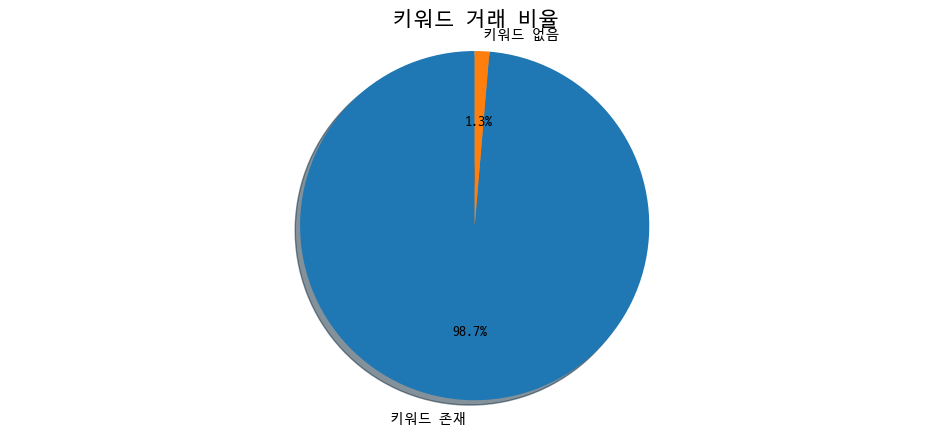

In [71]:
# 키워드 유무별 데이터 세팅
pie_yes = len(yes_df)
pie_no = len(no_df)
pie_data = [pie_yes, pie_no]

# 파이 차트 생성
plt.figure(figsize=(12, 5))
plt.pie(pie_data, labels=['키워드 존재', '키워드 없음'], autopct='%1.1f%%', startangle=90, shadow=True)
plt.title('키워드 거래 비율', fontsize=15)
plt.axis('equal')  # 파이 차트가 원형으로 보이도록 설정
plt.show()

거래된 대부분의 강의가 키워드가 존재

## 일별 강의 판매 횟수(트랜트 그래프)

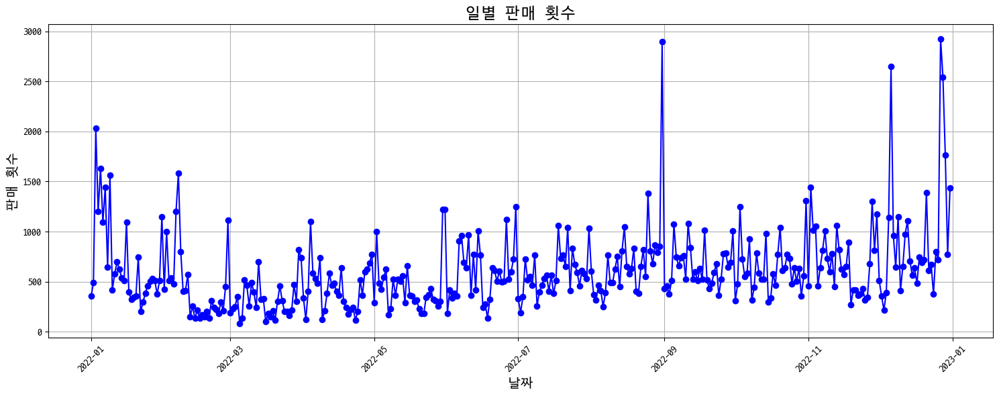

In [72]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

# 일별로 그룹화하고, 각 그룹의 크기(판매 횟수)를 계산
daily_sales = total_df.groupby(total_df['결제완료'].dt.date).size()

# 판매횟수 시각화
plt.figure(figsize=(15, 6))
plt.plot(daily_sales.index, daily_sales.values, marker='o', linestyle='-', color='b')
plt.title('일별 판매 횟수', fontsize=17)
plt.xlabel('날짜', fontsize=14)
plt.ylabel('판매 횟수', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()  # 플롯의 레이아웃을 조정하여 라벨이 잘리지 않도록 함
plt.show()

결제가 유독 많이 일어나는 날짜가 존재하는 것 처럼보인다.

In [73]:
daily_sales.sort_values(ascending=False).head(4)

결제완료
2022-12-27    2926
2022-08-31    2894
2022-12-06    2649
2022-12-28    2542
dtype: int64

### 결제가 많이 일어난 날의 과목들 파악

In [74]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

total_df[total_df['결제완료'].dt.date==datetime.strptime('2022-12-27', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    2325
(B2G)K-Dig     189
권오상의 금융 아카      66
한 번에 끝내는 데      40
한 번에 끝내는 컴      20
Name: count, dtype: int64

In [75]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

total_df[total_df['결제완료'].dt.date==datetime.strptime('2022-08-31', '%Y-%m-%d').date()]['title'].value_counts().head()

title
권오상의 금융 아카    336
CLASS : 건축    228
Live2D로 만드    166
김민태의 프론트엔드    150
한 번에 끝내는 부    144
Name: count, dtype: int64

In [76]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

total_df[total_df['결제완료'].dt.date==datetime.strptime('2022-12-28', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    2025
네오아카데미 : 완      44
권오상의 금융 아카      36
한 번에 끝내는 데      36
문서의 신이 알려주      23
Name: count, dtype: int64

In [77]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

total_df[total_df['결제완료'].dt.date==datetime.strptime('2022-12-06', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    2040
권오상의 금융 아카     150
(B2B) K-Di     102
편집하는여자의 영상      30
(B2G)K-Dig      19
Name: count, dtype: int64

k-dig란 과목의 거래 횟수가 엄청 많은것을 알 수있다 (다른 것들의 15 ~ 50배)

### 키워드가 존재하는 데이터의 일별 판매

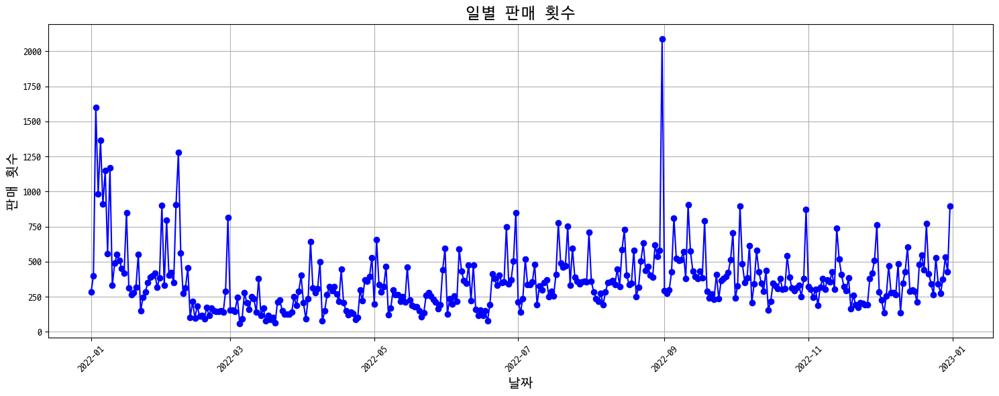

In [78]:
# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

# 일별로 그룹화하고, 각 그룹의 크기(판매 횟수)를 계산
daily_sales = yes_df.groupby(yes_df['결제완료'].dt.date).size()

# 판매횟수 시각화
plt.figure(figsize=(15, 6))
plt.plot(daily_sales.index, daily_sales.values, marker='o', linestyle='-', color='b')
plt.title('일별 판매 횟수', fontsize=17)
plt.xlabel('날짜', fontsize=14)
plt.ylabel('판매 횟수', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()  # 플롯의 레이아웃을 조정하여 라벨이 잘리지 않도록 함
plt.show()

In [79]:
daily_sales.sort_values(ascending=False).head(4)

결제완료
2022-08-31    2090
2022-01-03    1602
2022-01-05    1366
2022-02-07    1279
dtype: int64

In [80]:
# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

yes_df[yes_df['결제완료'].dt.date==datetime.strptime('2022-08-31', '%Y-%m-%d').date()]['title'].value_counts().head()

title
CLASS : 건축    228
Live2D로 만드    166
해오의 입문자를 위     94
네오아카데미 : 완     59
네오아카데미 : 까     58
Name: count, dtype: int64

In [81]:
# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

yes_df[yes_df['결제완료'].dt.date==datetime.strptime('2022-01-03', '%Y-%m-%d').date()]['title'].value_counts().head()

title
한 번에 끝내는 프    78
Kubernetes    67
블렌더로 만드는 동    63
한 번에 끝내는 데    56
한 번에 끝내는 딥    43
Name: count, dtype: int64

In [82]:
# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

yes_df[yes_df['결제완료'].dt.date==datetime.strptime('2022-01-05', '%Y-%m-%d').date()]['title'].value_counts().head()

title
한 번에 끝내는 디    83
한 번에 끝내는 프    81
한번에 끝내는 모션    69
블렌더로 만드는 동    57
한 번에 끝내는 컴    46
Name: count, dtype: int64

In [83]:
# '결제완료' 컬럼을 datetime 타입으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

yes_df[yes_df['결제완료'].dt.date==datetime.strptime('2022-01-07', '%Y-%m-%d').date()]['title'].value_counts().head()

title
블렌더로 만드는 동    57
Kubernetes    46
한 번에 끝내는 데    44
한 번에 끝내는 프    42
나의 칼퇴치트키 엑    36
Name: count, dtype: int64

한번에 끝내는 ~ 시리즈들이 인기가 많다

### 키워드가 없는 데이터의 일별 판매

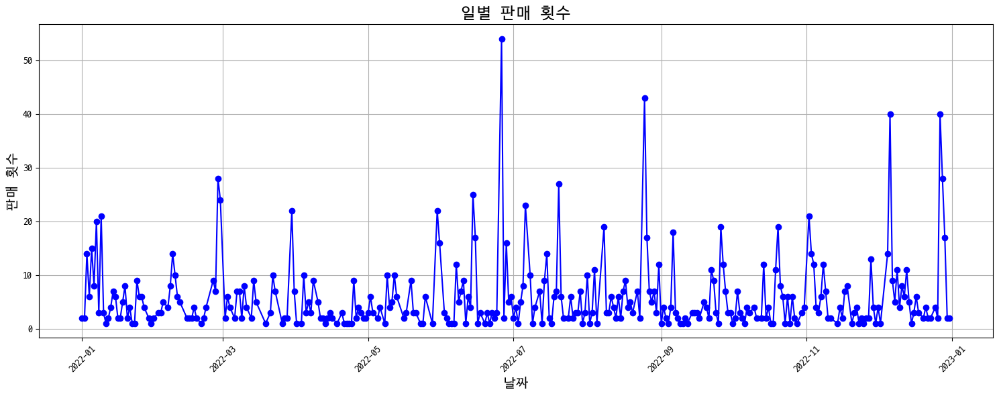

In [84]:
# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

# 일별로 그룹화하고, 각 그룹의 크기(판매 횟수)를 계산
daily_sales = no_df.groupby(no_df['결제완료'].dt.date).size()

# 판매횟수 시각화
plt.figure(figsize=(15, 6))
plt.plot(daily_sales.index, daily_sales.values, marker='o', linestyle='-', color='b')
plt.title('일별 판매 횟수', fontsize=17)
plt.xlabel('날짜', fontsize=14)
plt.ylabel('판매 횟수', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()  # 플롯의 레이아웃을 조정하여 라벨이 잘리지 않도록 함
plt.show()

In [85]:
daily_sales.sort_values(ascending=False).head(4)

결제완료
2022-06-26    54
2022-08-25    43
2022-12-06    40
2022-12-27    40
dtype: int64

In [86]:
# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

no_df[no_df['결제완료'].dt.date==datetime.strptime('2022-06-26', '%Y-%m-%d').date()]['title'].value_counts().head()

title
조MD의 스마트스토    54
Name: count, dtype: int64

In [87]:
# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

no_df[no_df['결제완료'].dt.date==datetime.strptime('2022-08-25', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    24
(B2G)K-Dig    19
Name: count, dtype: int64

In [88]:
# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

no_df[no_df['결제완료'].dt.date==datetime.strptime('2022-12-06', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    34
(B2B) K-Di     3
조MD의 스마트스토     2
(B2G)K-Dig     1
Name: count, dtype: int64

In [89]:
# '결제완료' 컬럼을 datetime 타입으로 변환
no_df['결제완료'] = pd.to_datetime(no_df['결제완료'])

no_df[no_df['결제완료'].dt.date==datetime.strptime('2022-12-27', '%Y-%m-%d').date()]['title'].value_counts().head()

title
(B2G) K-Di    31
(B2G)K-Dig     9
Name: count, dtype: int64

## 월별 시간에 따른 강의 거래 횟수 시각화(트랜드 그래프)

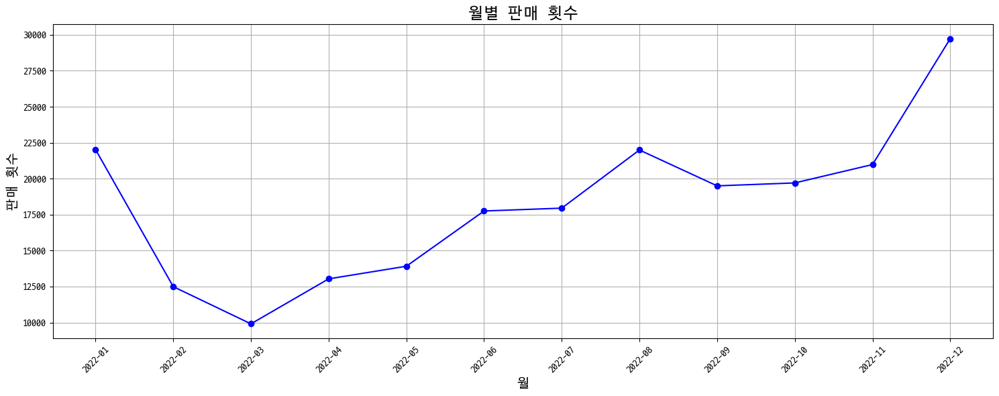

In [90]:
# '결제완료' 컬럼을 datetime 타입으로 변환
total_df['결제완료'] = pd.to_datetime(total_df['결제완료'])

# 월별로 그룹화하고, 각 그룹의 크기(판매 횟수)를 계산
monthly_sales = total_df.groupby(total_df['결제완료'].dt.to_period('M')).size()

# 판매횟수 시각화
plt.figure(figsize=(15, 6))
# 월별 판매 횟수 데이터를 시각화하기 위해 인덱스를 문자열로 변환
plt.plot(monthly_sales.index.astype(str), monthly_sales.values, marker='o', linestyle='-', color='b')
plt.title('월별 판매 횟수', fontsize=17)
plt.xlabel('월', fontsize=14)
plt.ylabel('판매 횟수', fontsize=14)
plt.xticks(rotation=45)  # x축 라벨을 45도 회전
plt.grid(True)  # 격자 보이기
plt.tight_layout()  # 플롯의 레이아웃을 조정
plt.show()

전반적으로 우상향하는 성향을 띄워 순탄히 성장중인 것을 알 수 있다.

## 인기 있는 시리즈 비교해보기

In [91]:
# 문자열에서 마지막 단어를 제거하는 함수
def remove_last_word(text):
    words = text.split()  # 공백을 기준으로 단어 분할
    return ' '.join(words[:-1]) if len(words) > 1 else text  # 마지막 단어 제외하고 다시 결합

# 'title' 컬럼에 함수 적용 후 '시리즈' 컬럼에 저장
total_df['시리즈'] = total_df['title'].apply(remove_last_word)

In [92]:
total_df['title'].value_counts()

title
(B2G) K-Di    22450
한 번에 끝내는 데    15964
권오상의 금융 아카    14326
한 번에 끝내는 부     7094
한 번에 끝내는 컴     6537
              ...  
부동산 투자 올인원        1
앱/웹 서비스 기획        1
그로스 마케팅 올인        1
UX/UI 포트폴리        1
글로벌 1위 Sal        1
Name: count, Length: 262, dtype: int64

In [93]:
# 같은 시리즈는 변경
total_df.loc[total_df['시리즈'] == '한번에 끝내는', '시리즈'] = '한 번에 끝내는'

In [94]:
total_df['시리즈'].value_counts()

시리즈
한 번에 끝내는    63816
(B2G)       22450
권오상의 금융     14326
네오아카데미 :     9115
편집하는여자의      6484
            ...  
UX/UI           1
그로스 마케팅         1
앱/웹 서비스         1
글로벌 1위          1
부동산 투자          1
Name: count, Length: 209, dtype: int64

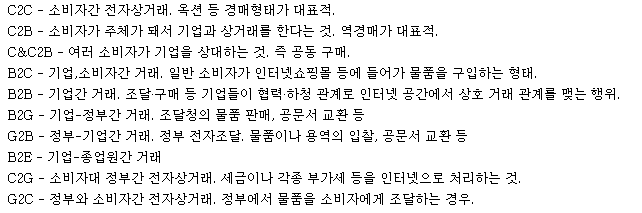

b2g는 국비지원 부트캠프


b2b는 기업에서 요청한 기업 강의?

한번에 끝나는 시리즈 ~ 들이 인기가 제일 많고 판매 비중또한 큰 것을 알 수 있다.

그리고 B2G(국비지원 부트캠프)의 강의들이 그 다음으로 인기가 많은 것을 알 수 있다.

### 워드 클라우드로 인기 있는 시리즈 시각화

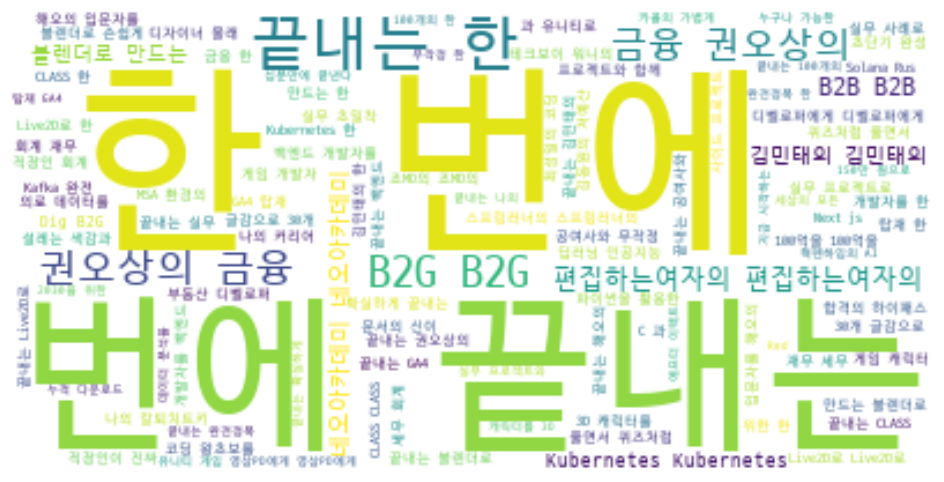

In [96]:
# 필요한 라이브러리를 임포트
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 워드클라우드 생성을 위한 텍스트 데이터 준비
text = ' '.join(total_df['시리즈'].dropna().tolist())

wordcloud = WordCloud(font_path=font_path, background_color='white').generate(text)

plt.figure(figsize=(15, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## 거래가 많이 된 거래들의 키워드 시각화

In [97]:
total_df['시리즈'].value_counts().head(10)

시리즈
한 번에 끝내는      63816
(B2G)         22450
권오상의 금융       14326
네오아카데미 :       9115
편집하는여자의        6484
(B2B)          6423
Kubernetes     6002
김민태의           5150
블렌더로 만드는       3870
CLASS :        2884
Name: count, dtype: int64

### 시리즈별 워드 클라우드 시각화

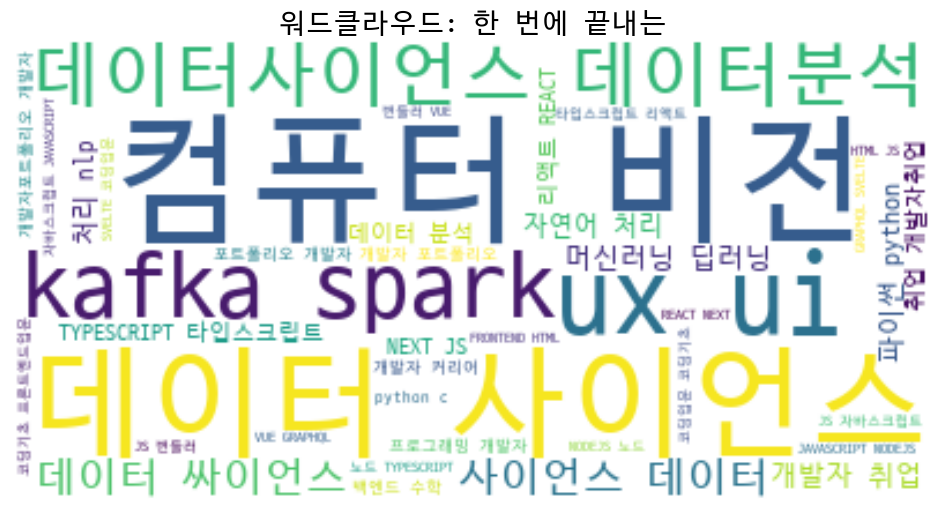

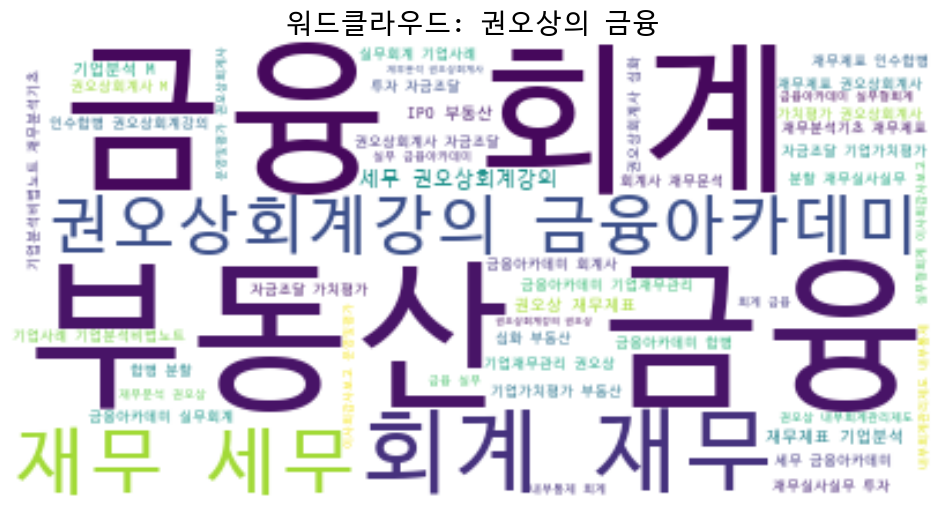

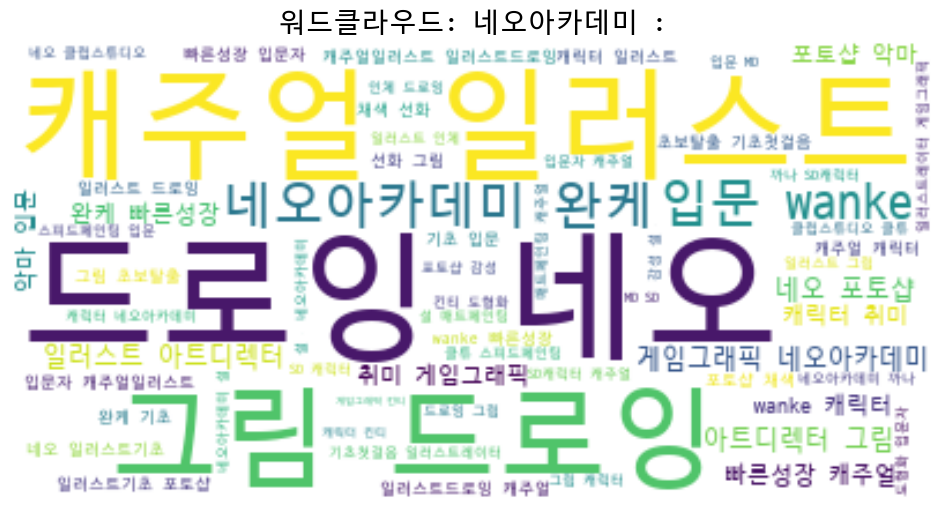

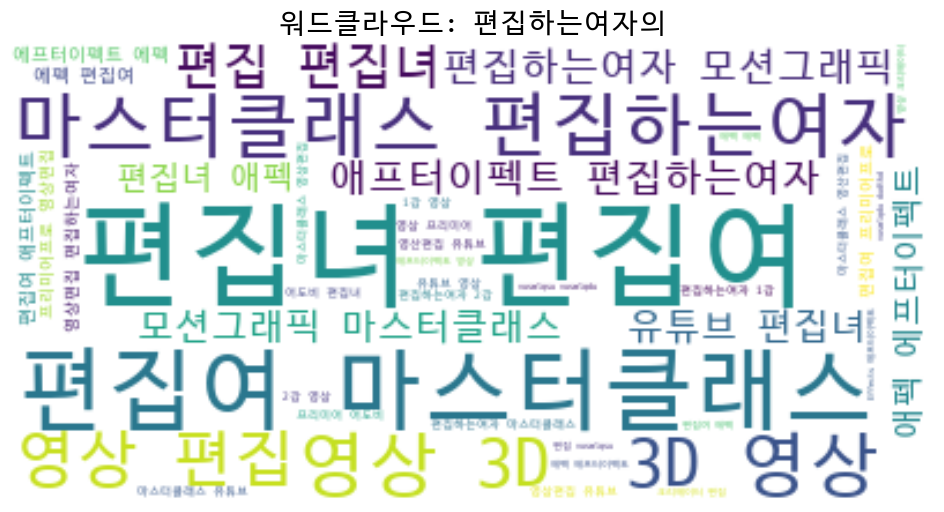

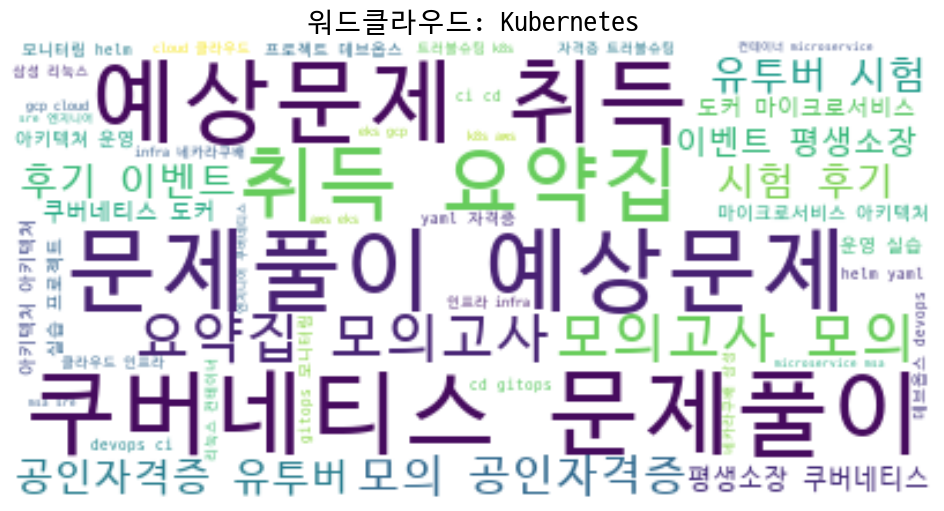

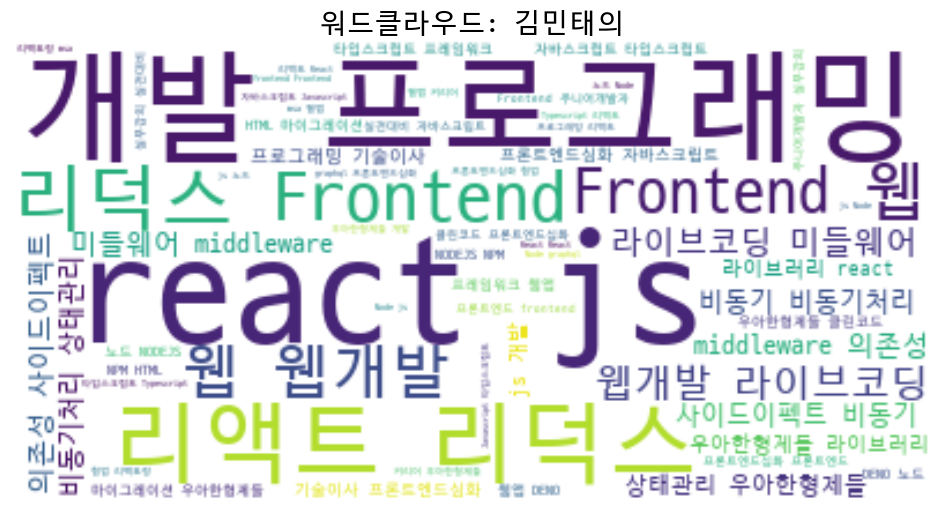

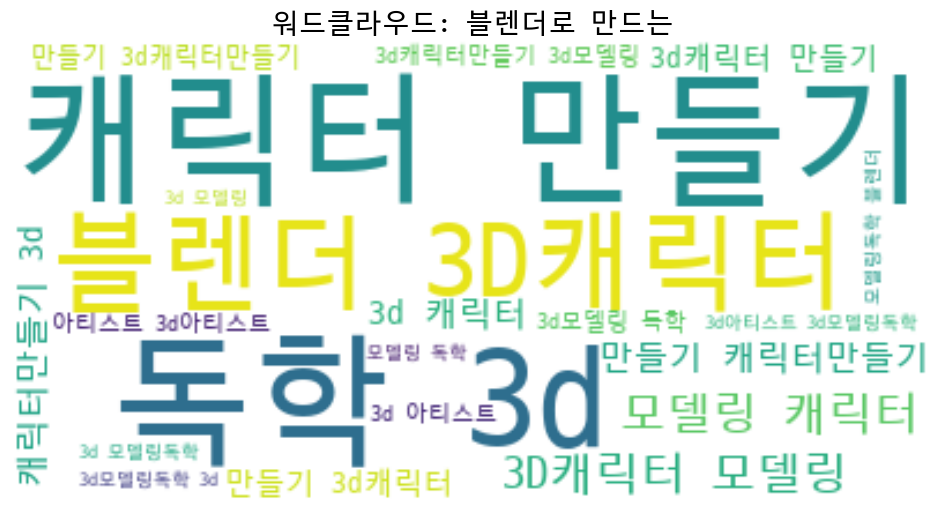

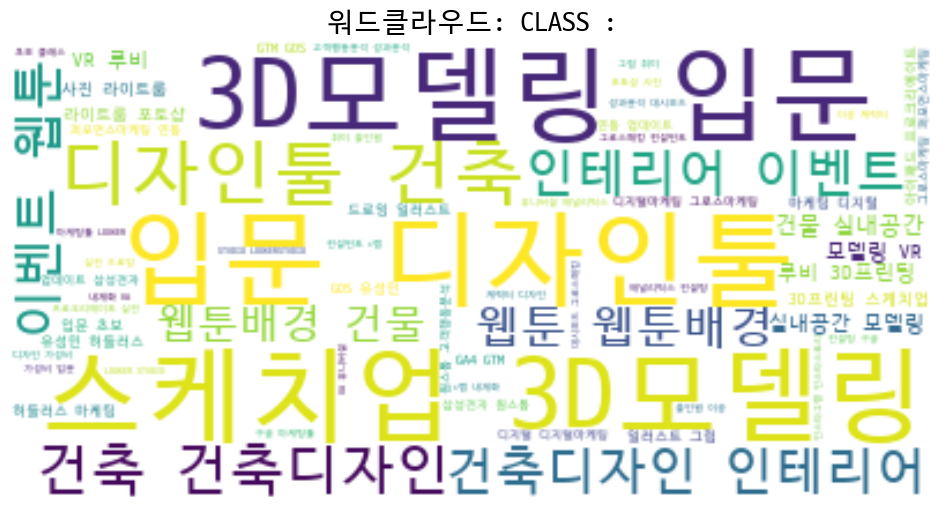

In [98]:
# 가장 빈번한 10개의 시리즈 값을 리스트로 저장
a = list(total_df['시리즈'].value_counts().head(10).index)

for i in a:
    # 특정 시리즈에 해당하는 모든 텍스트 데이터를 결합
    filtered_df = total_df[total_df['시리즈'] == i]
    if not filtered_df.empty:  # 비어 있지 않은 경우에만 실행
        text = ' '.join(filtered_df['keywords'].dropna())  # 'keywords' 컬럼의 텍스트 데이터 결합

        if text:  # 결합된 텍스트가 비어 있지 않은 경우에만 워드클라우드 생성
            # 워드클라우드 생성
            wordcloud = WordCloud(font_path=font_path, background_color='white').generate(text)

            # 워드클라우드 시각화
            plt.figure(figsize=(15, 6))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'워드클라우드: {i}', fontsize=20)
            plt.show()

시리즈 별로 인기 있는 과목들
- 한번에 끝내는 시리즈 :  데이터 사이언스, UX UI, 카프카 스파크, 컴퓨터비전

- 권오상의 금융 : 금융 회계, 부동산 금융, 재무

- 네오아카데미 : 그림, 드로잉, 캐주얼 일러스트, 게임그래픽

- 편집하는여자의 : 마스터클래스, 영상 3D, 3D 영상, 영상편집

- Kubernetes : 문제풀이, 예상문제, 예상문제 취득

- 김민태의 : 리엑트 리덕스, 개발 프로그래밍, react js

- 블랜더로 만드는 : 독학 3d 캐릭터 만들기, 블랜더 3D 캐릭터

- class : 스케치업, 3D 모델링, 입문 디자인툴, 3D모델링 입문, 디자인툴 건축

In [99]:
total_df['시리즈'].value_counts()

시리즈
한 번에 끝내는    63816
(B2G)       22450
권오상의 금융     14326
네오아카데미 :     9115
편집하는여자의      6484
            ...  
UX/UI           1
그로스 마케팅         1
앱/웹 서비스         1
글로벌 1위          1
부동산 투자          1
Name: count, Length: 209, dtype: int64

# LDA

## LDA(Latent Dirichlet Allocation) 토픽 모델링을 통해 토픽들 추려내기


### 토큰화

In [100]:
import pandas as pd
from gensim import corpora, models
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.pyplot as plt
import re

# 쉼표와 띄어쓰기를 모두 고려하여 텍스트 토큰화
def tokenize(text):
    tokens = re.split(',\s*|\s+', text)  # 쉼표 뒤에 옵셔널한 공백이 있거나, 하나 이상의 공백을 구분자로 사용
    return tokens

# 'keywords' 컬럼의 문자열을 쉼표와 띄어쓰기로 분리하여 토큰화
processed_texts = [tokenize(text) for text in yes_df['keywords']]



### 실루엣계수 파악

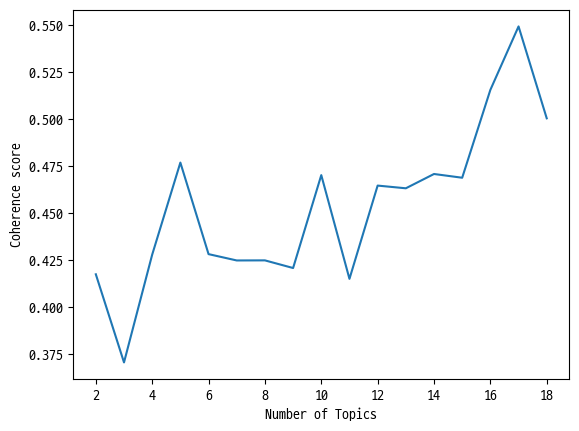

Optimal number of topics: 17
Highest Coherence Score: 0.5494904361017933


In [101]:
# 사전과 코퍼스 생성
dictionary = corpora.Dictionary(processed_texts)
corpus = [dictionary.doc2bow(text) for text in processed_texts]

# 코헤런스 점수 계산 및 최적의 토픽 수 찾기
coherence_values = []
model_list = []
for num_topics in range(2, 19):
    model = models.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary, passes=10)
    model_list.append(model)
    coherencemodel = CoherenceModel(model=model, texts=processed_texts, dictionary=dictionary, coherence='c_v')
    coherence_values.append(coherencemodel.get_coherence())

# 최적의 토픽 수 시각화
x = range(2, 19)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.show()

# 최적의 토픽 수 출력
optimal_index = coherence_values.index(max(coherence_values))
optimal_num_topics = x[optimal_index]
print("Optimal number of topics:", optimal_num_topics)
print("Highest Coherence Score:", coherence_values[optimal_index])

### 최적 모델의 토픽 출력

In [102]:
# 최적의 모델의 토픽 출력
optimal_model = model_list[optimal_index]
topics = optimal_model.print_topics(num_words=4)
for topic in topics:
    print(topic)

(0, '0.120*"딥러닝" + 0.109*"인공지능" + 0.083*"패키지" + 0.041*"텐서플로우"')
(1, '0.049*"백엔드심화" + 0.043*"앱기획" + 0.038*"서버" + 0.032*"업데이트"')
(2, '0.083*"일러스트" + 0.080*"그림" + 0.079*"드로잉" + 0.062*"취미"')
(3, '0.112*"데이터분석" + 0.091*"데이터" + 0.079*"데이터사이언스" + 0.066*"머신러닝"')
(4, '0.054*"데브옵스" + 0.048*"평생소장" + 0.046*"아키텍처" + 0.033*"aws"')
(5, '0.161*"영상" + 0.089*"모션그래픽" + 0.087*"게임" + 0.086*"그래픽"')
(6, '0.058*"블록체인" + 0.046*"딥러닝기초" + 0.046*"딥러닝입문" + 0.046*"강의"')
(7, '0.067*"backend" + 0.047*"프로젝트" + 0.034*"데이터베이스" + 0.033*"M&A"')
(8, '0.057*"쿼리" + 0.036*"개발자" + 0.035*"글쓰기" + 0.033*"커리어"')
(9, '0.132*"입문" + 0.054*"마케팅" + 0.049*"주식" + 0.034*"구글"')
(10, '0.062*"피그마" + 0.060*"ui" + 0.044*"UI" + 0.042*"ux"')
(11, '0.048*"금융" + 0.048*"부동산" + 0.045*"회계" + 0.037*"재무"')
(12, '0.206*"초격차" + 0.037*"스케치업" + 0.033*"건축" + 0.033*"디자인"')
(13, '0.071*"파이썬" + 0.060*"개발자" + 0.054*"ai" + 0.051*"취업"')
(14, '0.091*"포토샵" + 0.082*"캐주얼" + 0.042*"클립스튜디오" + 0.037*"비즈니스"')
(15, '0.085*"프론트엔드" + 0.062*"vc" + 0.057*"취업" + 0.045*"클론코딩"')

In [103]:
optimal_model.print_topics()

[(0,
  '0.120*"딥러닝" + 0.109*"인공지능" + 0.083*"패키지" + 0.041*"텐서플로우" + 0.041*"파이토치" + 0.034*"시그니처" + 0.034*"AI" + 0.032*"tensorflow" + 0.030*"혁펜하임" + 0.029*"pytorch"'),
 (1,
  '0.049*"백엔드심화" + 0.043*"앱기획" + 0.038*"서버" + 0.032*"업데이트" + 0.031*"안드로이드" + 0.030*"모바일앱" + 0.030*"크로스플랫폼" + 0.030*"모바일" + 0.030*"앱개발" + 0.028*"앱개발입문"'),
 (2,
  '0.083*"일러스트" + 0.080*"그림" + 0.079*"드로잉" + 0.062*"취미" + 0.049*"게임그래픽" + 0.047*"네오" + 0.047*"네오아카데미" + 0.041*"아트디렉터" + 0.034*"완케" + 0.034*"빠른성장"'),
 (3,
  '0.112*"데이터분석" + 0.091*"데이터" + 0.079*"데이터사이언스" + 0.066*"머신러닝" + 0.052*"컴퓨터비전" + 0.044*"사이언스" + 0.041*"엔지니어링" + 0.036*"경진대회" + 0.036*"컴피티션" + 0.036*"캐글"'),
 (4,
  '0.054*"데브옵스" + 0.048*"평생소장" + 0.046*"아키텍처" + 0.033*"aws" + 0.030*"엔지니어" + 0.029*"devops" + 0.028*"실습" + 0.027*"네카라쿠배" + 0.026*"도커" + 0.026*"쿠버네티스"'),
 (5,
  '0.161*"영상" + 0.089*"모션그래픽" + 0.087*"게임" + 0.086*"그래픽" + 0.079*"3D" + 0.068*"애프터이펙트" + 0.052*"스튜디오" + 0.034*"에프터이펙트" + 0.022*"모션그래픽스튜디오" + 0.022*"델픽"'),
 (6,
  '0.058*"블록체인" + 0.046*"딥러닝기초" + 0.0

### 토픽 모델 시각화

In [104]:
import pandas as pd
import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# PyLDAVis 준비
lda_display = gensimvis.prepare(model, corpus, dictionary, sort_topics=False)

# 시각화
pyLDAvis.display(lda_display)#

## 토픽별 판매 횟수

In [105]:
# 각 문서의 주요 토픽 찾기
dominant_topics = []
for i, row_list in enumerate(optimal_model[corpus]):
    row = row_list[0] if optimal_model.per_word_topics else row_list
    row = sorted(row, key=lambda x: (x[1]), reverse=True)
    # 가장 비중이 높은 토픽과 그 비중
    dominant_topic = row[0][0]
    dominant_topics.append(dominant_topic)

# 토픽별 문서 수 계산
from collections import Counter
topic_counts = Counter(dominant_topics)
for topic_num, num_docs in topic_counts.items():
    print(f"Topic {topic_num}: {num_docs} documents")

Topic 0: 6866 documents
Topic 9: 9258 documents
Topic 11: 11329 documents
Topic 16: 9587 documents
Topic 2: 16558 documents
Topic 14: 13312 documents
Topic 5: 6246 documents
Topic 7: 5609 documents
Topic 3: 7600 documents
Topic 13: 6387 documents
Topic 4: 7983 documents
Topic 10: 5882 documents
Topic 6: 6955 documents
Topic 15: 6421 documents
Topic 8: 3819 documents
Topic 1: 5836 documents
Topic 12: 2981 documents


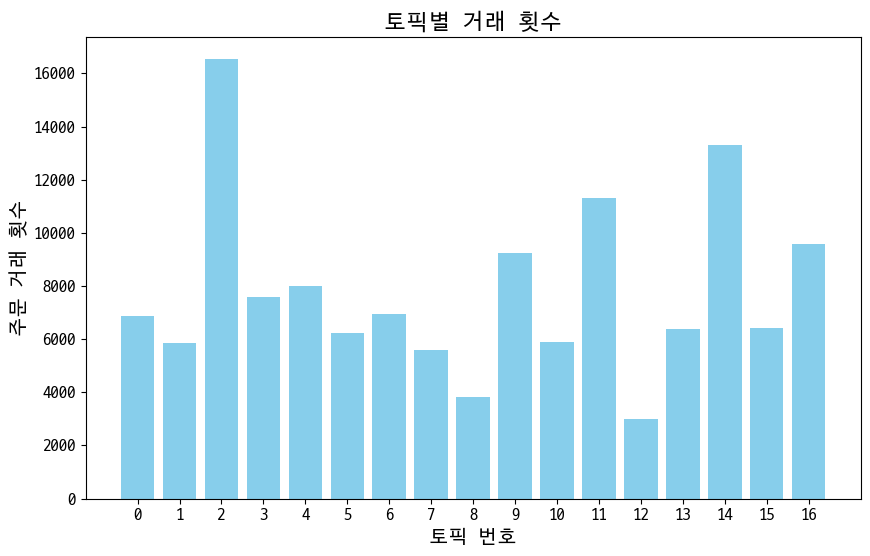

In [106]:
# 토픽별 문서 수 계산
topic_counts = Counter(dominant_topics)

# 토픽 번호와 문서 수를 분리하여 리스트로 저장
topics = list(topic_counts.keys())
counts = list(topic_counts.values())

# 막대 그래프로 시각화
plt.figure(figsize=(10, 6))
plt.bar(topics, counts, color='skyblue')
plt.xlabel('토픽 번호', fontsize=14)
plt.ylabel('주문 거래 횟수', fontsize=14)
plt.title('토픽별 거래 횟수', fontsize=16)
plt.xticks(topics, fontsize=12)
plt.yticks(fontsize=12)
plt.show()

### 학습된 모델 해석하기

- 토픽 0: 인공지능 및 딥러닝
    - 주요 키워드: 딥러닝, 인공지능, 패키지, 텐서플로우, 파이토치
    - 유저 세그먼트: AI와 딥러닝 기술을 활용하고자 하는 개발자 및 연구원
- 토픽 1: 모바일 앱 개발
    - 주요 키워드: 백엔드심화, 앱기획, 서버, 안드로이드, 모바일앱
    - 유저 세그먼트: 모바일 앱 개발에 관심 있는 앱 개발자 및 기획자
- 토픽 2: 그래픽 디자인 및 아트
    - 주요 키워드: 일러스트, 그림, 드로잉, 게임그래픽, 아트디렉터
    - 유저 세그먼트: 그래픽 디자인 및 아트에 관심 있는 디자이너 및 아티스트
- 토픽 3: 데이터 사이언스 및 머신러닝
    - 주요 키워드: 데이터분석, 데이터사이언스, 머신러닝, 컴퓨터비전, 캐글
    - 유저 세그먼트: 데이터 분석 및 머신러닝 역량을 키우고자 하는 분석가 및 과학자
- 토픽 4: 클라우드 및 DevOps
    - 주요 키워드: 데브옵스, 아키텍처, aws, devops, 쿠버네티스
    - 유저 세그먼트: 클라우드 인프라 및 DevOps에 관심 있는 시스템 관리자 및 엔지니어
- 토픽 5: 영상 및 모션 그래픽
    - 주요 키워드: 영상, 모션그래픽, 게임, 3D, 애프터이펙트
    - 유저 세그먼트: 비디오 및 모션 그래픽 제작에 관심 있는 크리에이터 및 디자이너
- 토픽 6: 블록체인 및 프로그래밍
    - 주요 키워드: 블록체인, 딥러닝기초, 암호화폐, 프로그래밍
    - 유저 세그먼트: 블록체인 기술 및 프로그래밍 학습을 원하는 개발자 및 투자자
- 토픽 7: 백엔드 개발
    - 주요 키워드: backend, 프로젝트, 데이터베이스, kafka, mongodb
    - 유저 세그먼트: 서버 및 백엔드 시스템 개발에 관심 있는 개발자
- 토픽 8: 소프트웨어 개발 및 코딩
    - 주요 키워드: 쿼리, 개발자, 글쓰기, 포트폴리오, 코딩
    - 유저 세그먼트: 소프트웨어 개발 및 개인 포트폴리오 구축에 관심 있는 개발자
- 토픽 9: 디지털 마케팅 및 최적화
    - 주요 키워드: 입문, 마케팅, 주식, 구글 애널리틱스
    - 유저 세그먼트: 디지털 마케팅 및 데이터 분석을 활용하고자 하는 마케터 및 분석가
- 토픽 10: 사용자 인터페이스 디자인
    - 주요 키워드: 피그마, ui, ux, 프로토타이핑, 포트폴리오
    - 유저 세그먼트: UI/UX 디자인을 배우거나 향상시키고자 하는 웹 및 앱 디자이너
- 토픽 11: 금융 및 부동산
    - 주요 키워드: 금융, 부동산, 회계, 재무, 세무
    - 유저 세그먼트: 금융, 부동산, 회계 기초나 심화 지식을 습득하고자 하는 개인 및 전문가
- 토픽 12: 초격차 시리즈 및 건축 디자인
    - 주요 키워드: 초격차, 스케치업, 건축, 인테리어, 라이노
    - 유저 세그먼트: 건축 및 인테리어 디자인에 관심 있는 학생이나 전문가
- 토픽 13: 프로그래밍 및 취업 스킬즈
    - 주요 키워드: 파이썬, 개발자, ai, 취업, 포트폴리오
    - 유저 세그먼트: 프로그래밍 및 AI 기술을 배우며 취업을 준비하는 학생 및 전문가
- 토픽 14: 디지털 아트 및 비즈니스 스킬즈
    - 주요 키워드: 포토샵, 캐주얼, 클립스튜디오, 비즈니스, 영어메일
    - 유저 세그먼트: 디지털 아트 기술 및 비즈니스 커뮤니케이션 스킬을 키우고자 하는 개인
- 토픽 15: 프론트엔드 개발 및 벤처 캐피탈
    - 주요 키워드: 프론트엔드, vc, 클론코딩, 벤처캐피탈
    - 유저 세그먼트: 프론트엔드 개발 기술을 배우거나 벤처 캐피탈 업계에 진출하고자 하는 개인
- 토픽 16: 3D 캐릭터 디자인 및 모델링
    - 주요 키워드: 캐릭터, 만들기, 3d, 모델링, 블렌더
    - 유저 세그먼트: 3D 모델링 및 캐릭터 디자인에 관심 있는 게임 디자이너 및 아티스트

### 해석된 토픽 라벨링 하기

In [152]:
yes_df['dominant_topic'] = dominant_topics

# 토픽 설명 매핑
topic_descriptions = {
     0 : "인공지능 및 딥러닝",
     1 : "모바일 앱 개발",
     2 : "그래픽 디자인 및 아트",
     3 : "데이터 사이언스 및 머신러닝",
     4 : "클라우드 및 DevOps",
     5 : "영상 및 모션 그래픽",
     6 : "블록체인 및 프로그래밍",
     7 : "백엔드 개발",
     8 : "소프트웨어 개발 및 코딩",
     9 : "디지털 마케팅 및 최적화",
     10: "사용자 인터페이스 디자인",
     11: "금융 및 부동산",
     12: "초격차 시리즈 및 건축 디자인",
     13: "프로그래밍 및 취업 스킬즈",
     14: "디지털 아트 및 비즈니스 스킬즈",
     15: "프론트엔드 개발 및 벤처 캐피탈",
     16: "3D 캐릭터 디자인 및 모델링"
}

# 데이터 프레임에 토픽 설명 적용
yes_df['토픽 설명'] = yes_df['dominant_topic'].map(topic_descriptions)

# 결과 확인
print(yes_df[['dominant_topic', '토픽 설명']].head())


   dominant_topic          토픽 설명
0               0     인공지능 및 딥러닝
1               0     인공지능 및 딥러닝
2               9  디지털 마케팅 및 최적화
3              11       금융 및 부동산
4              11       금융 및 부동산


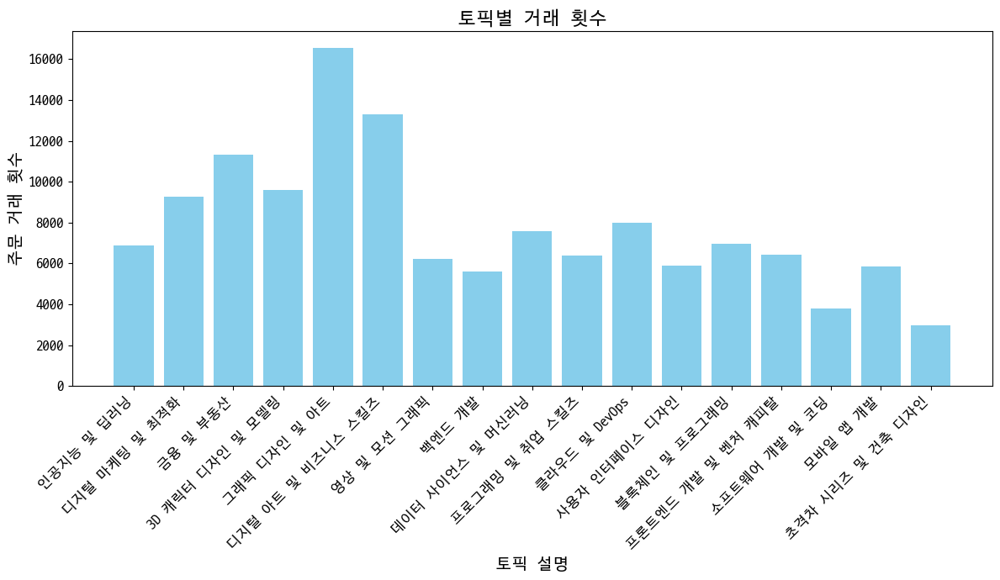

In [142]:
# 토픽별 문서 수 계산
topic_counts = Counter(dominant_topics)

# 토픽 번호와 문서 수를 분리하여 리스트로 저장
topics = list(topic_counts.keys())
counts = list(topic_counts.values())

# 토픽 번호를 토픽 설명으로 변환
topic_labels = [topic_descriptions.get(topic, f"토픽 {topic}") for topic in topics]  # 안전한 접근 방식

# 막대 그래프로 시각화
plt.figure(figsize=(12, 7))
plt.bar(topic_labels, counts, color='skyblue')
plt.xlabel('토픽 설명', fontsize=14)
plt.ylabel('주문 거래 횟수', fontsize=14)
plt.title('토픽별 거래 횟수', fontsize=16)
plt.xticks(rotation=45, fontsize=12, ha='right')  # x축 라벨 회전 및 가로 정렬 조정
plt.yticks(fontsize=12)
plt.tight_layout()  # 그래프 레이아웃 조정
plt.show()


LDA를 통해 토픽들을 나누고 이를 EDA해본 결과 그래픽 디자인과 아트 부분의 판매 비중이 높은 것을 알 수 있다.

## 토픽별 월별 판매 횟수 시각화

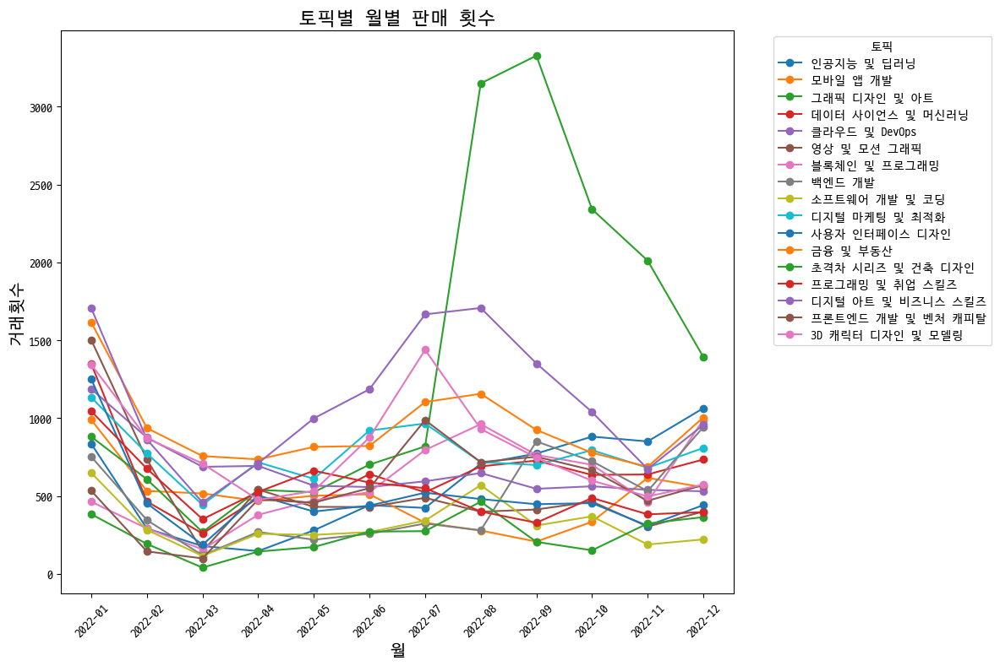

In [143]:
# 월별로 데이터 분류
yes_df['월'] = yes_df['결제완료'].dt.to_period('M')

# '월' 컬럼과 'dominant_topic'을 기반으로 문서 수 집계
monthly_topic_count = yes_df.groupby(['월', 'dominant_topic']).size().reset_index(name='count')

# pivot_table을 사용하여 데이터를 '월'에 따라 정렬하고, 컬럼을 'dominant_topic'으로 설정
pivot_data = monthly_topic_count.pivot_table(index='월', columns='dominant_topic', values='count', fill_value=0)

# 토픽 설명을 컬럼 라벨로 사용
pivot_data.columns = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in pivot_data.columns]

# 선 그래프 그리기
plt.figure(figsize=(12, 8))
for topic in pivot_data.columns:
    plt.plot(pivot_data.index.astype(str), pivot_data[topic], marker='o', label=topic)

plt.title('토픽별 월별 판매 횟수', fontsize=16)
plt.xlabel('월', fontsize=14)
plt.ylabel('거래횟수', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='토픽', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


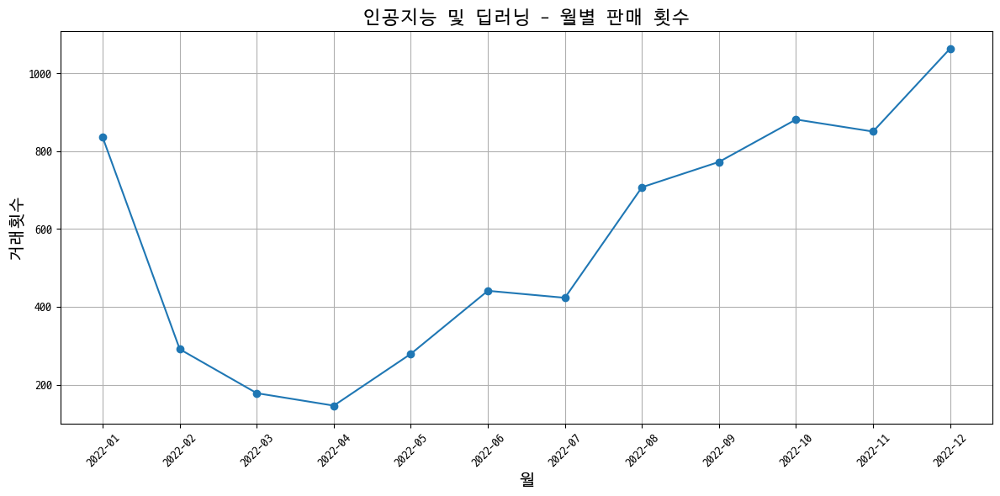

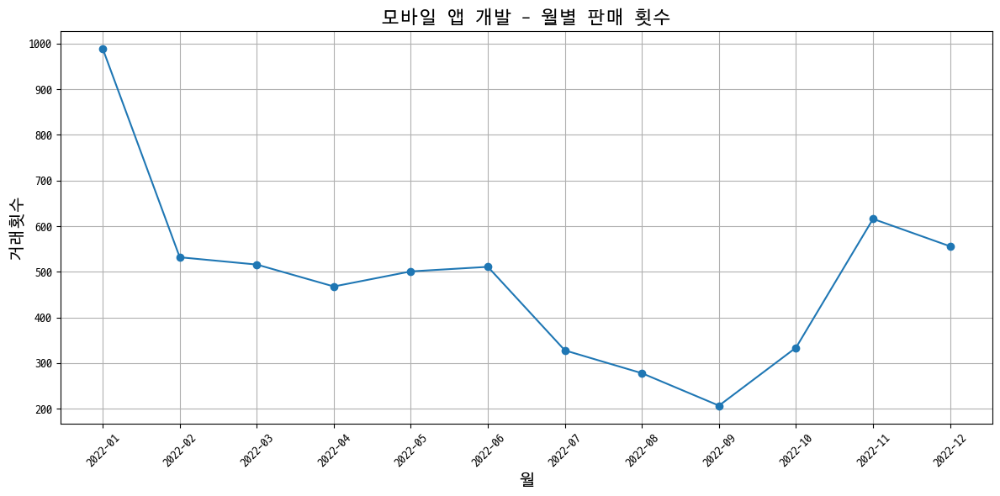

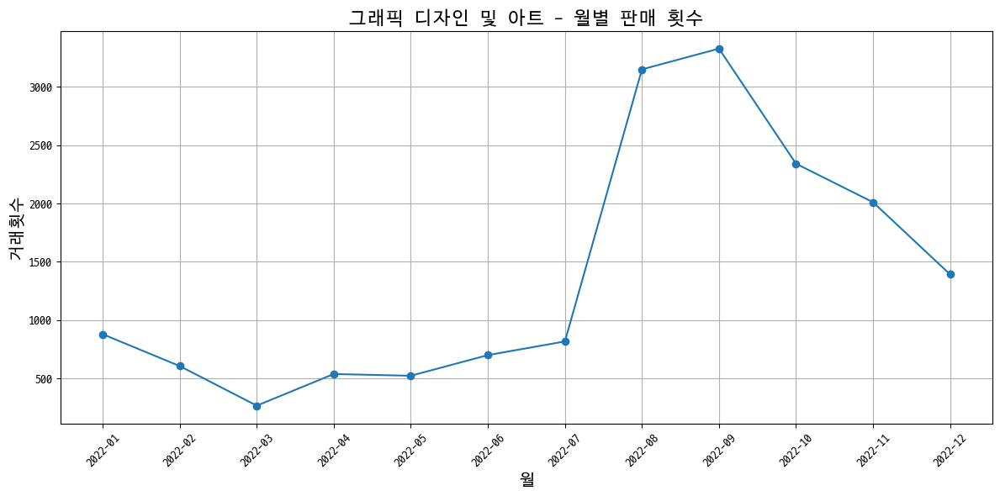

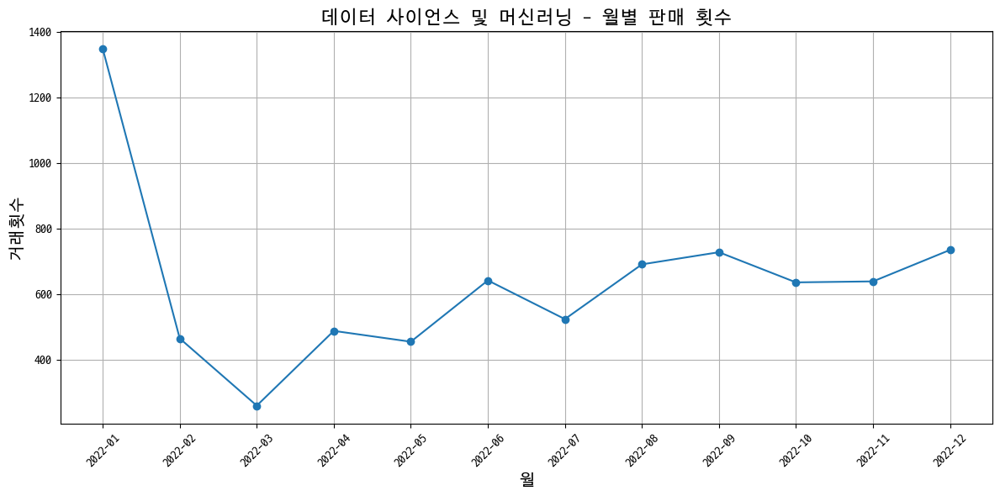

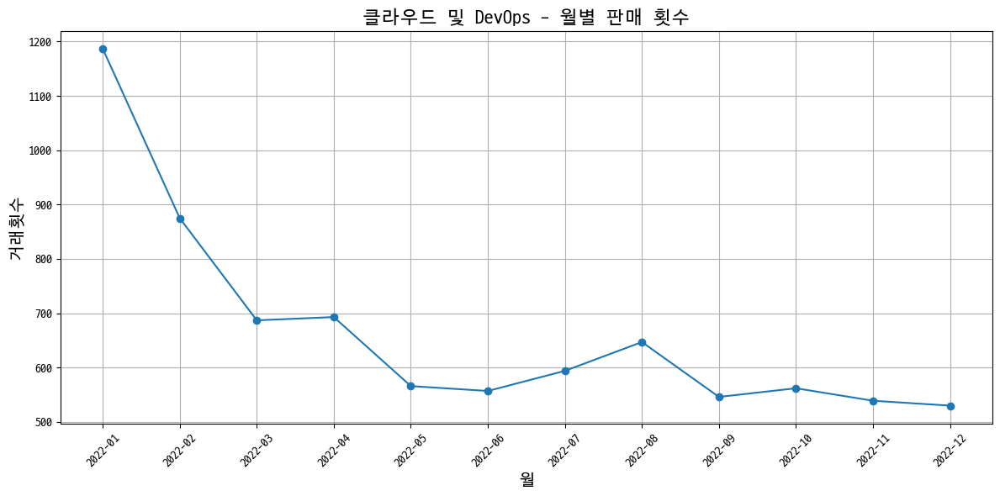

...

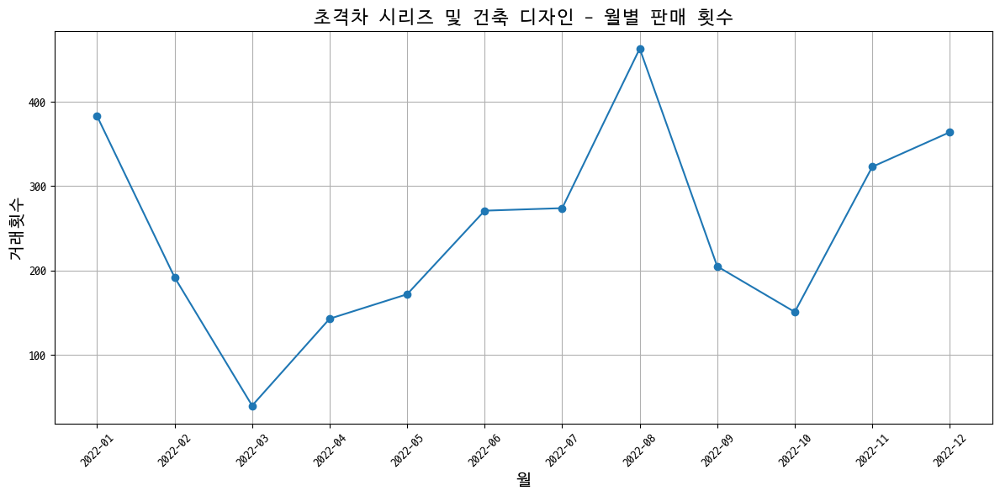

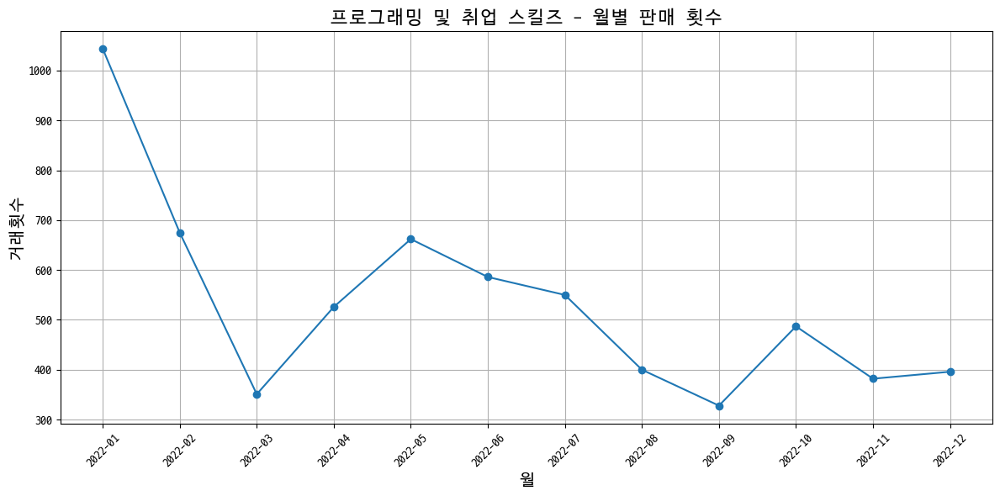

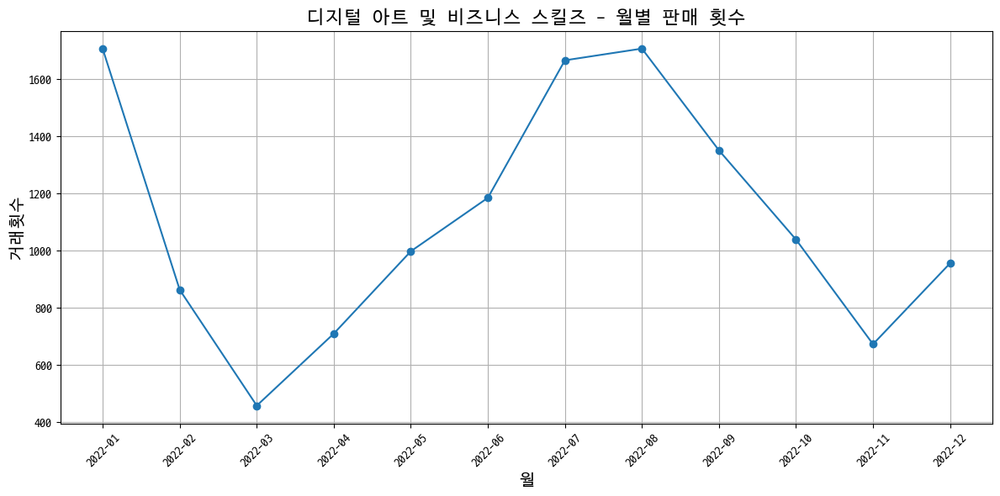

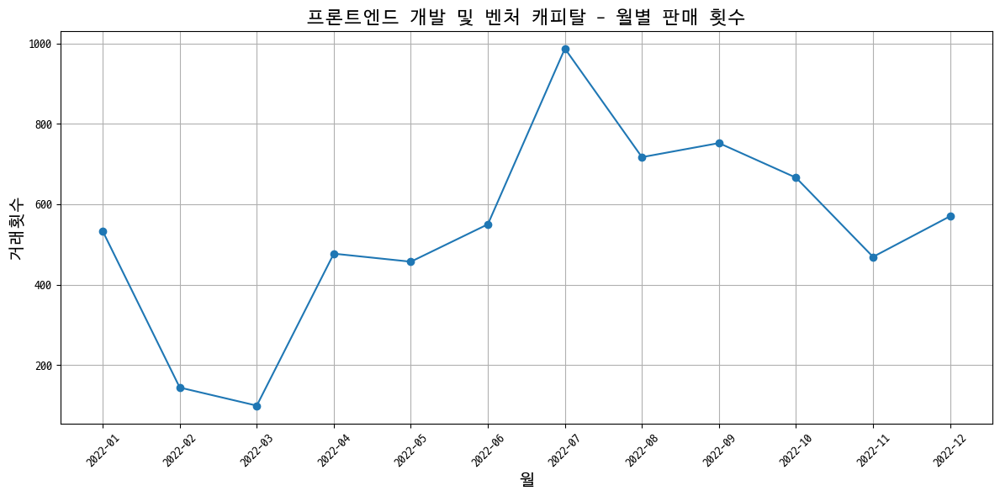

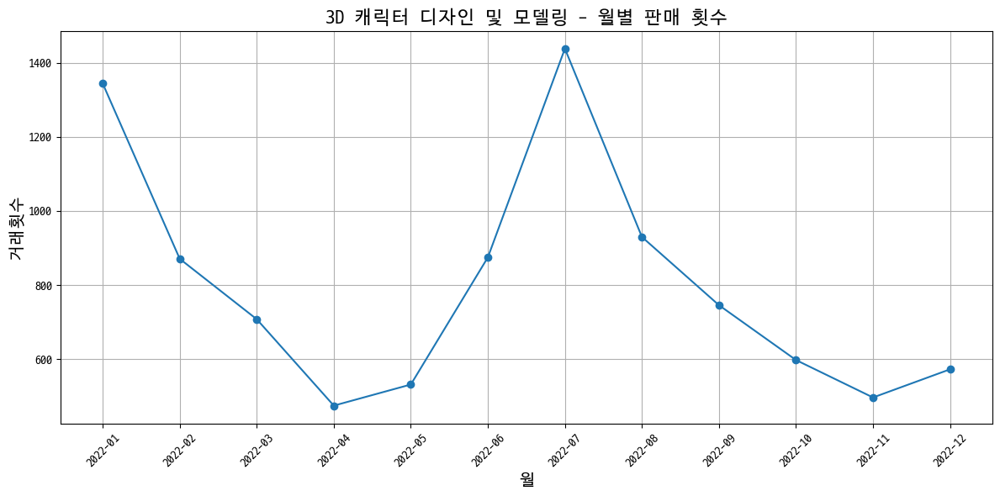

In [144]:
# pivot_table을 사용하여 데이터를 '월'에 따라 정렬하고, 컬럼을 'dominant_topic'으로 설정
pivot_data = monthly_topic_count.pivot_table(index='월', columns='dominant_topic', values='count', fill_value=0)

# 토픽 설명을 컬럼 라벨로 사용
pivot_data.columns = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in pivot_data.columns]

# 각 토픽별로 별도의 그래프 그리기
for topic in pivot_data.columns:
    plt.figure(figsize=(12, 6))  # 그래프 크기 설정
    plt.plot(pivot_data.index.astype(str), pivot_data[topic], marker='o', linestyle='-')
    plt.title(f'{topic} - 월별 판매 횟수', fontsize=16)
    plt.xlabel('월', fontsize=14)
    plt.ylabel('거래횟수', fontsize=14)
    plt.xticks(rotation=45)  # 날짜가 많을 경우 x 축 라벨 각도 조절
    plt.grid(True)  # 그리드 추가
    plt.tight_layout()
    plt.show()

## 토픽별 최대 판매 기록(월)

In [145]:
# 월별로 데이터 분류
yes_df['월'] = yes_df['결제완료'].dt.to_period('M')

# '월' 컬럼과 'dominant_topic'을 기반으로 문서 수 집계
monthly_topic_count = yes_df.groupby(['월', 'dominant_topic']).size().reset_index(name='count')

# pivot_table을 사용하여 데이터를 '월'에 따라 정렬하고, 컬럼을 'dominant_topic'으로 설정
pivot_data = monthly_topic_count.pivot_table(index='월', columns='dominant_topic', values='count', fill_value=0)

# 토픽 설명을 컬럼 라벨로 사용
pivot_data.columns = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in pivot_data.columns]

# 각 토픽별로 주문 수가 가장 높은 월을 찾기
for topic in pivot_data.columns:
    max_month = pivot_data[topic].idxmax()
    max_count = pivot_data[topic].max()
    print(f"{topic}: 최대 주문수 {max_count}가 있는 월은 {max_month}입니다.")


인공지능 및 딥러닝: 최대 주문수 1063.0가 있는 월은 2022-12입니다.
모바일 앱 개발: 최대 주문수 989.0가 있는 월은 2022-01입니다.
그래픽 디자인 및 아트: 최대 주문수 3327.0가 있는 월은 2022-09입니다.
데이터 사이언스 및 머신러닝: 최대 주문수 1348.0가 있는 월은 2022-01입니다.
클라우드 및 DevOps: 최대 주문수 1187.0가 있는 월은 2022-01입니다.
영상 및 모션 그래픽: 최대 주문수 1501.0가 있는 월은 2022-01입니다.
블록체인 및 프로그래밍: 최대 주문수 987.0가 있는 월은 2022-12입니다.
백엔드 개발: 최대 주문수 942.0가 있는 월은 2022-12입니다.
소프트웨어 개발 및 코딩: 최대 주문수 648.0가 있는 월은 2022-01입니다.
디지털 마케팅 및 최적화: 최대 주문수 1132.0가 있는 월은 2022-01입니다.
사용자 인터페이스 디자인: 최대 주문수 1250.0가 있는 월은 2022-01입니다.
금융 및 부동산: 최대 주문수 1615.0가 있는 월은 2022-01입니다.
초격차 시리즈 및 건축 디자인: 최대 주문수 463.0가 있는 월은 2022-08입니다.
프로그래밍 및 취업 스킬즈: 최대 주문수 1044.0가 있는 월은 2022-01입니다.
디지털 아트 및 비즈니스 스킬즈: 최대 주문수 1707.0가 있는 월은 2022-08입니다.
프론트엔드 개발 및 벤처 캐피탈: 최대 주문수 987.0가 있는 월은 2022-07입니다.
3D 캐릭터 디자인 및 모델링: 최대 주문수 1438.0가 있는 월은 2022-07입니다.


## 토픽별 최대 판매 기록(일)

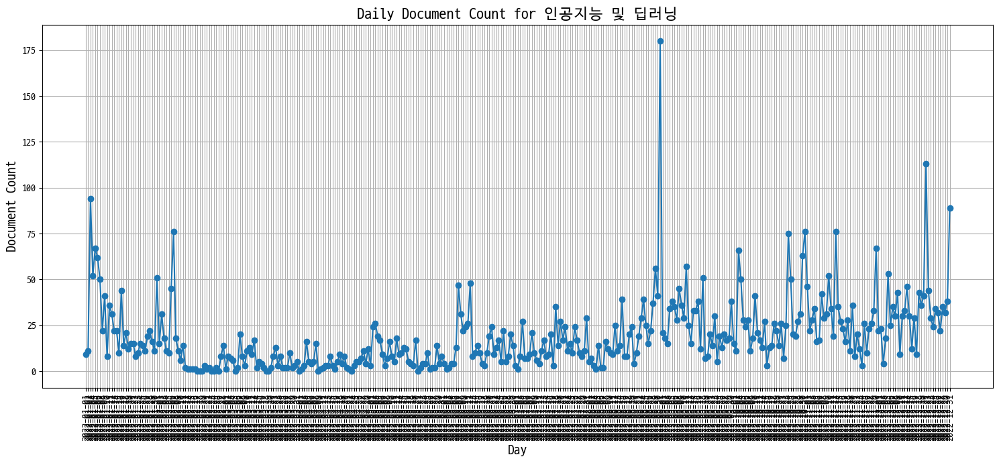

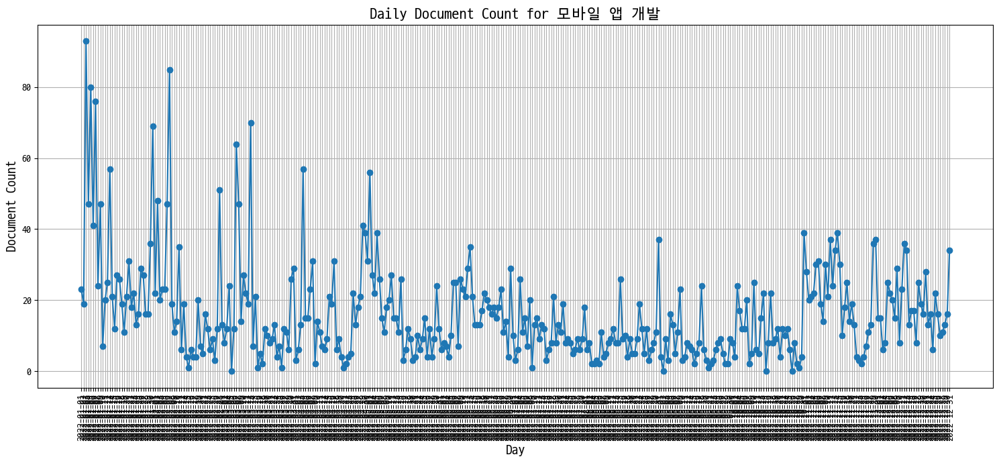

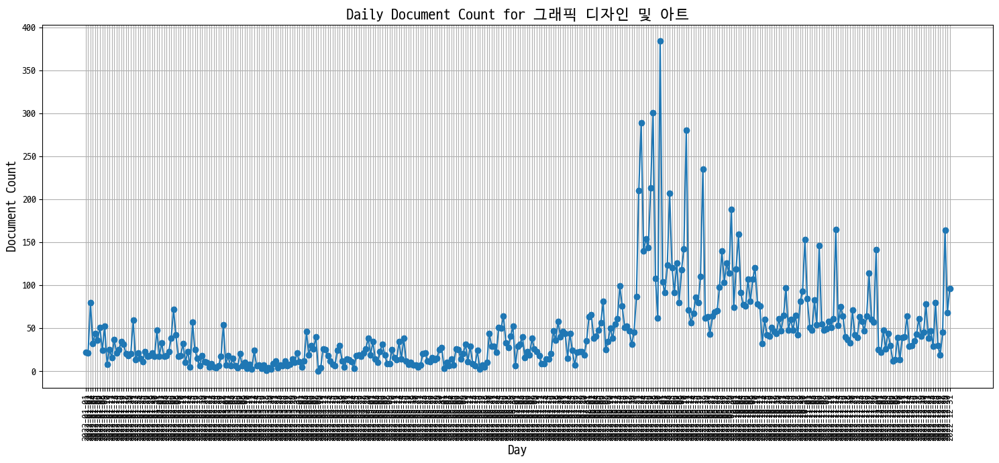

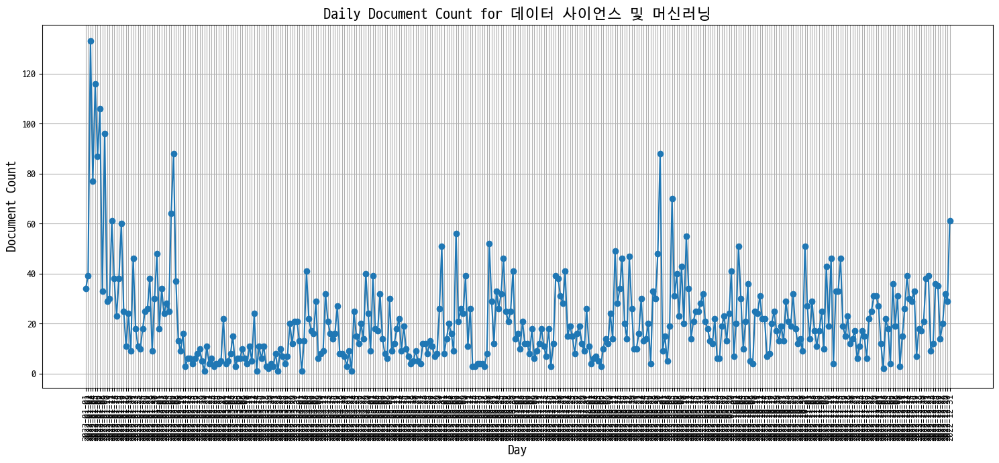

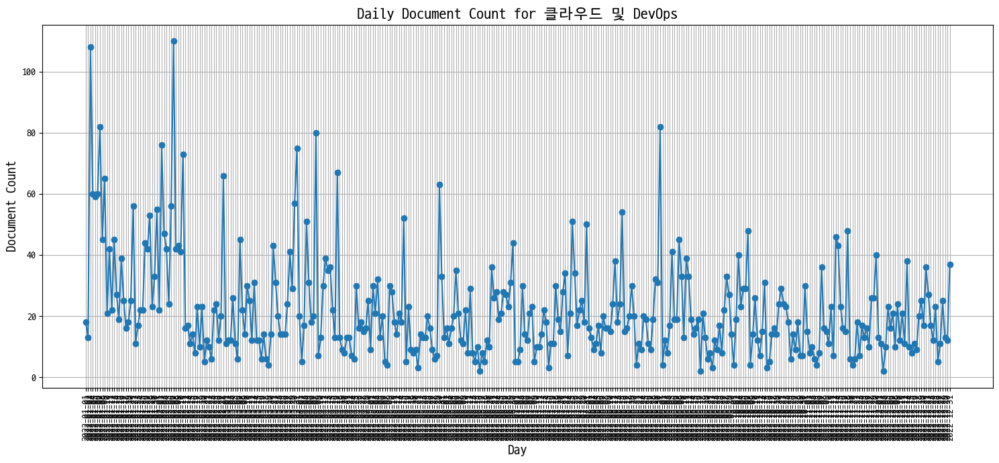

...

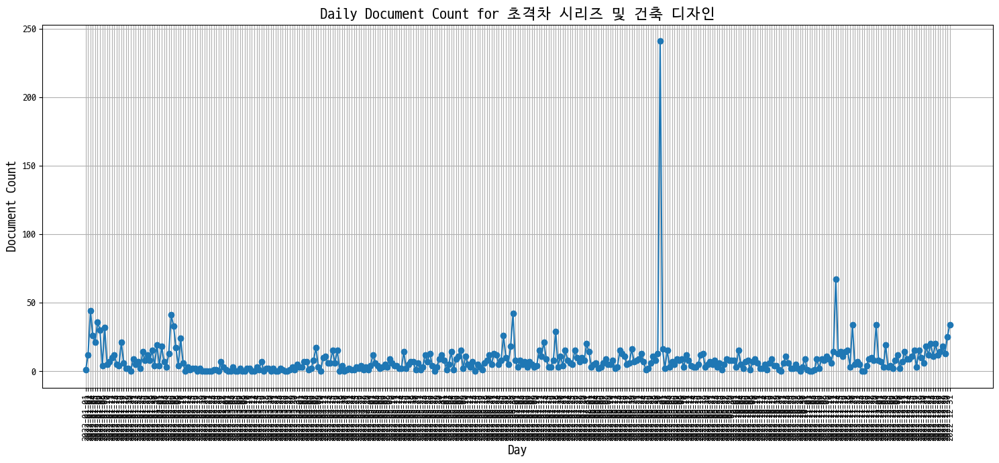

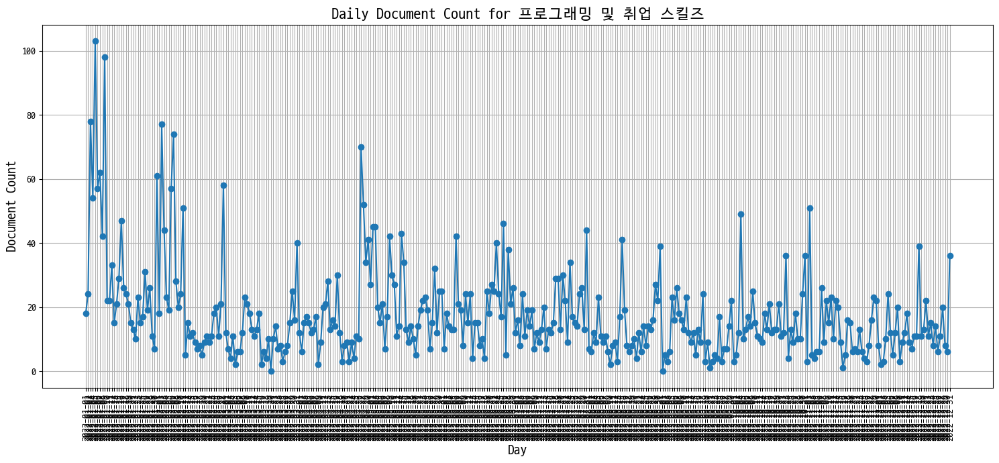

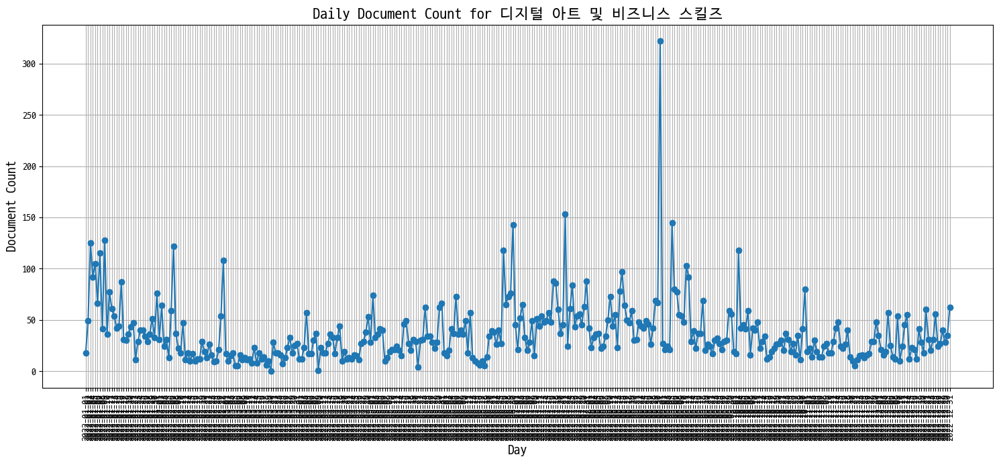

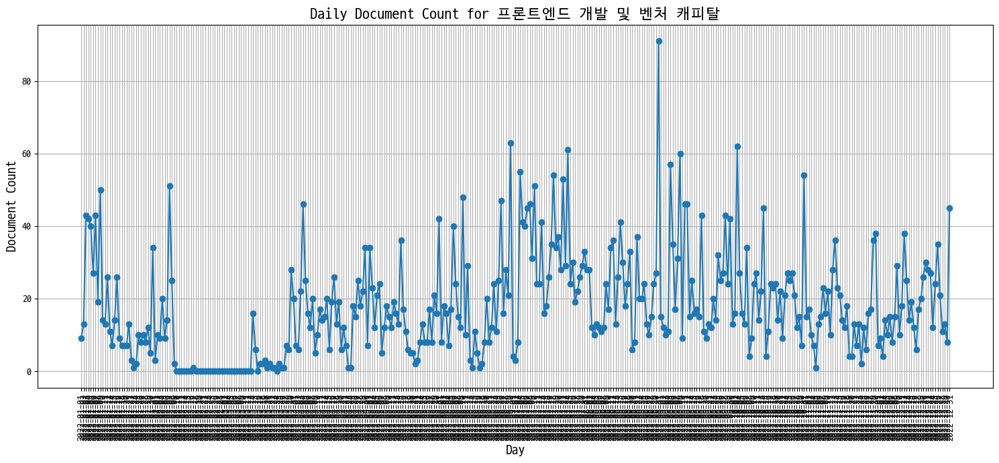

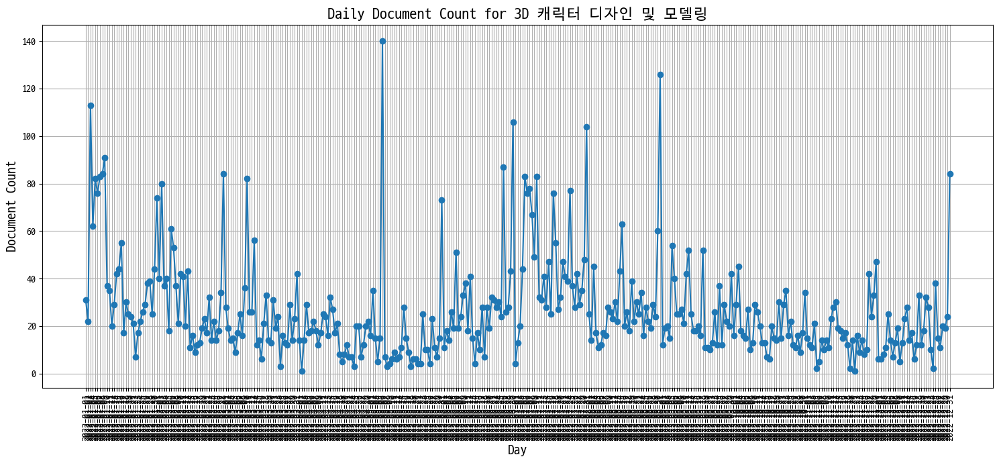

In [146]:
# '일' 컬럼 추가: '결제완료' 날짜에서 일자 정보만 추출
yes_df['일'] = yes_df['결제완료'].dt.to_period('D')

# '일' 컬럼과 'dominant_topic'을 기반으로 문서 수 집계
daily_topic_count = yes_df.groupby(['일', 'dominant_topic']).size().reset_index(name='count')

# pivot_table을 사용하여 데이터를 '일'에 따라 정렬하고, 컬럼을 'dominant_topic'으로 설정
pivot_data = daily_topic_count.pivot_table(index='일', columns='dominant_topic', values='count', fill_value=0)

# 토픽 번호를 토픽 설명으로 변환
pivot_data.columns = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in pivot_data.columns]

# 각 토픽별로 별도의 그래프 그리기
for topic in pivot_data.columns:
    plt.figure(figsize=(15, 7))  # 그래프 크기 설정
    plt.plot(pivot_data.index.astype(str), pivot_data[topic], marker='o', linestyle='-')
    plt.title(f'Daily Document Count for {topic}', fontsize=16)  # 토픽 설명을 제목에 사용
    plt.xlabel('Day', fontsize=14)
    plt.ylabel('Document Count', fontsize=14)
    plt.xticks(rotation=90)  # 날짜가 많을 경우 x 축 라벨 각도 조절
    plt.grid(True)  # 그리드 추가
    plt.tight_layout()  # 레이아웃 자동 조정
    plt.show()

In [147]:
# 각 토픽별로 주문 수가 가장 높은 일을 찾기
for topic in pivot_data.columns:
    # 각 토픽별로 최대 주문 수를 가진 일 찾기
    max_day = pivot_data[topic].idxmax()  # 주문 수가 가장 많은 날
    max_count = pivot_data[topic].max()  # 해당 날의 주문 수
    print(f"{topic}: 최대 주문수 {max_count}가 있는 날은 {max_day}입니다.")

인공지능 및 딥러닝: 최대 주문수 180.0가 있는 날은 2022-08-31입니다.
모바일 앱 개발: 최대 주문수 93.0가 있는 날은 2022-01-03입니다.
그래픽 디자인 및 아트: 최대 주문수 384.0가 있는 날은 2022-08-31입니다.
데이터 사이언스 및 머신러닝: 최대 주문수 133.0가 있는 날은 2022-01-03입니다.
클라우드 및 DevOps: 최대 주문수 110.0가 있는 날은 2022-02-07입니다.
영상 및 모션 그래픽: 최대 주문수 164.0가 있는 날은 2022-02-06입니다.
블록체인 및 프로그래밍: 최대 주문수 210.0가 있는 날은 2022-12-19입니다.
백엔드 개발: 최대 주문수 132.0가 있는 날은 2022-09-13입니다.
소프트웨어 개발 및 코딩: 최대 주문수 62.0가 있는 날은 2022-01-05입니다.
디지털 마케팅 및 최적화: 최대 주문수 120.0가 있는 날은 2022-01-05입니다.
사용자 인터페이스 디자인: 최대 주문수 101.0가 있는 날은 2022-01-05입니다.
금융 및 부동산: 최대 주문수 197.0가 있는 날은 2022-08-31입니다.
초격차 시리즈 및 건축 디자인: 최대 주문수 241.0가 있는 날은 2022-08-31입니다.
프로그래밍 및 취업 스킬즈: 최대 주문수 103.0가 있는 날은 2022-01-05입니다.
디지털 아트 및 비즈니스 스킬즈: 최대 주문수 322.0가 있는 날은 2022-08-31입니다.
프론트엔드 개발 및 벤처 캐피탈: 최대 주문수 91.0가 있는 날은 2022-08-31입니다.
3D 캐릭터 디자인 및 모델링: 최대 주문수 140.0가 있는 날은 2022-05-06입니다.


## 토픽별 시간대별 거래횟수 시각화

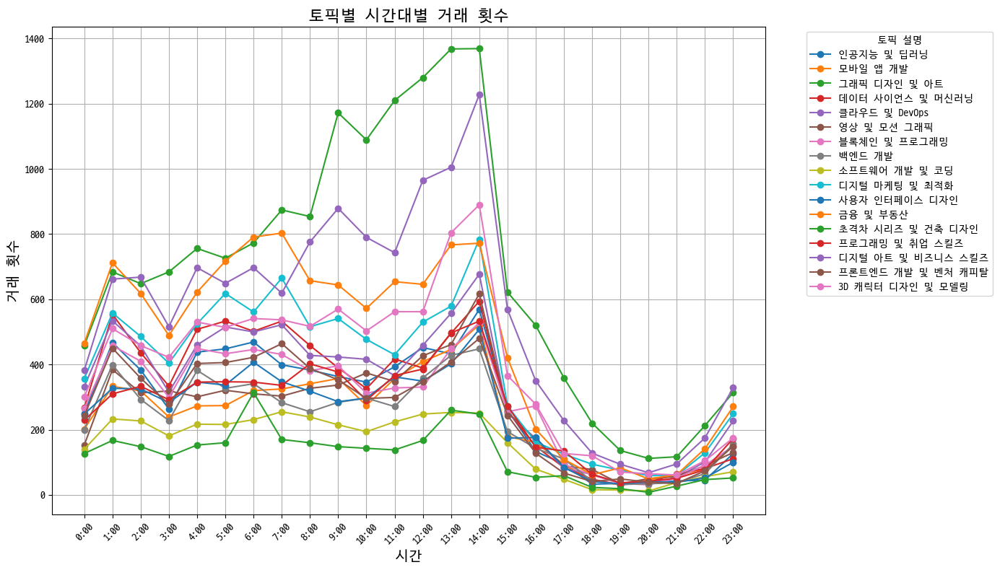

In [148]:
# 시간 정보 추출
yes_df['시간'] = yes_df['결제완료'].dt.hour

# 지배적인 토픽별로 시간별 주문 횟수 계산
hourly_topic_orders = yes_df.groupby(['시간', 'dominant_topic']).size().unstack(fill_value=0)

# 토픽 번호를 토픽 설명으로 변환
hourly_topic_orders.columns = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in hourly_topic_orders.columns]

# 시각화
plt.figure(figsize=(14, 8))
for topic in hourly_topic_orders.columns:
    plt.plot(hourly_topic_orders.index, hourly_topic_orders[topic], marker='o', label=topic)

plt.title('토픽별 시간대별 거래 횟수', fontsize=16)
plt.xlabel('시간', fontsize=14)
plt.ylabel('거래 횟수', fontsize=14)
plt.xticks(range(0, 24), [f"{hour}:00" for hour in range(0, 24)], rotation=45)  # 0시부터 23시까지 시간 레이블
plt.legend(title='토픽 설명', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [149]:
yes_df.columns

Index(['order_id', 'order_state', 'title', '결제완료', 'customer_id', '수업금액',
       'sale_price', '할인', '최근 결제일', 'user_id', '계정 생성 날짜', '최근 접속일', 'id',
       'created_at', 'description', 'total_class_hours', 'keywords', '월',
       'dominant_topic', '토픽 설명', '일', '시간', '할인율', 'keywords_list', '요일',
       '주말_주중', '가격_구간', '시리즈'],
      dtype='object')

## 토픽별 할인율 시각화 해보기

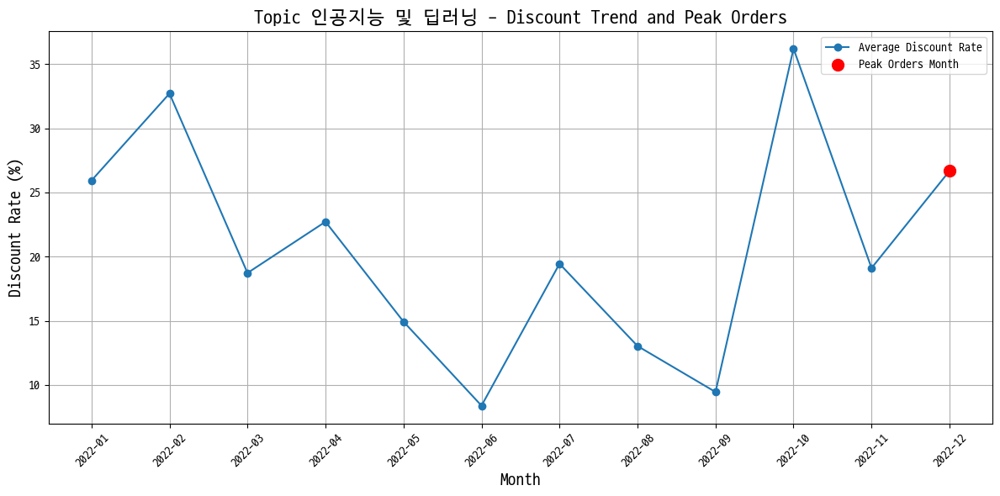

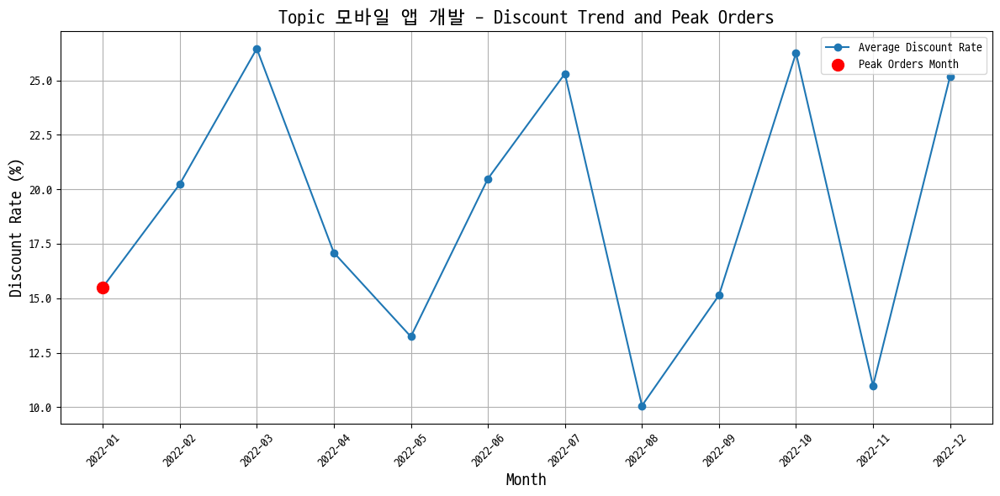

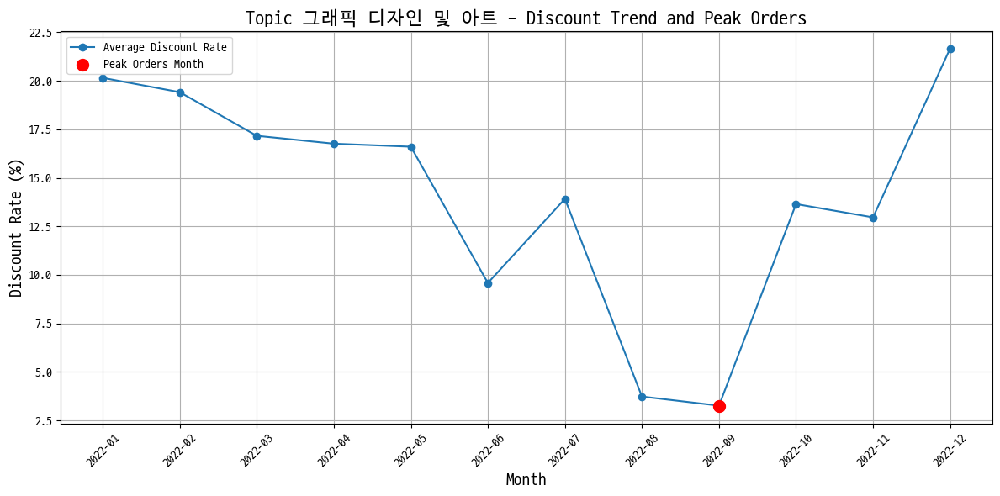

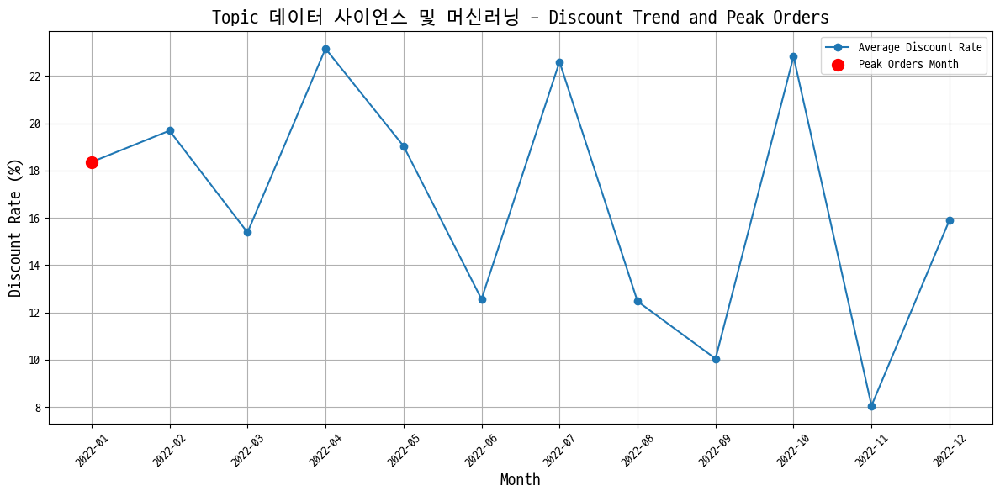

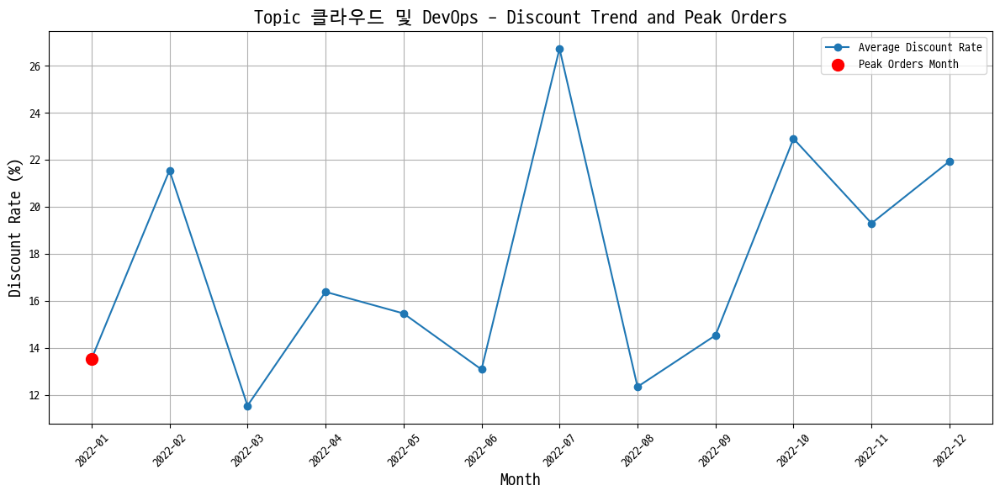

...

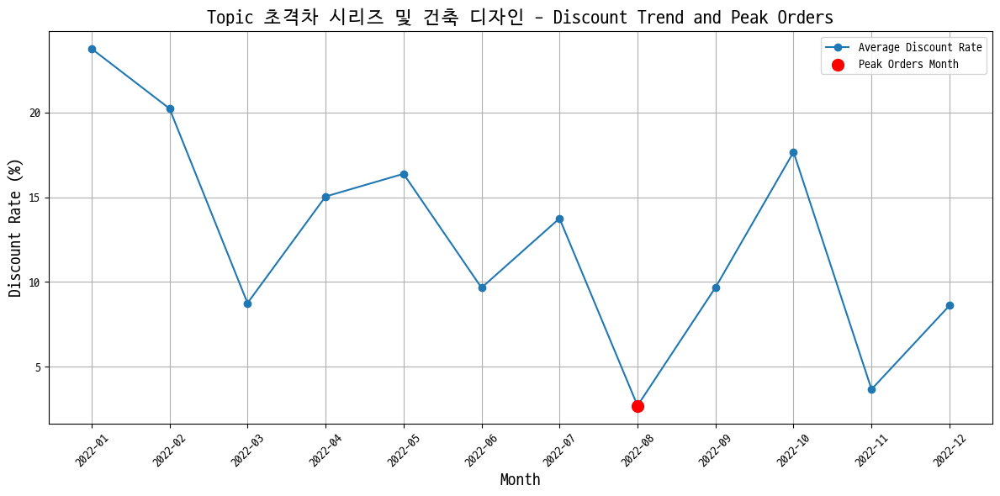

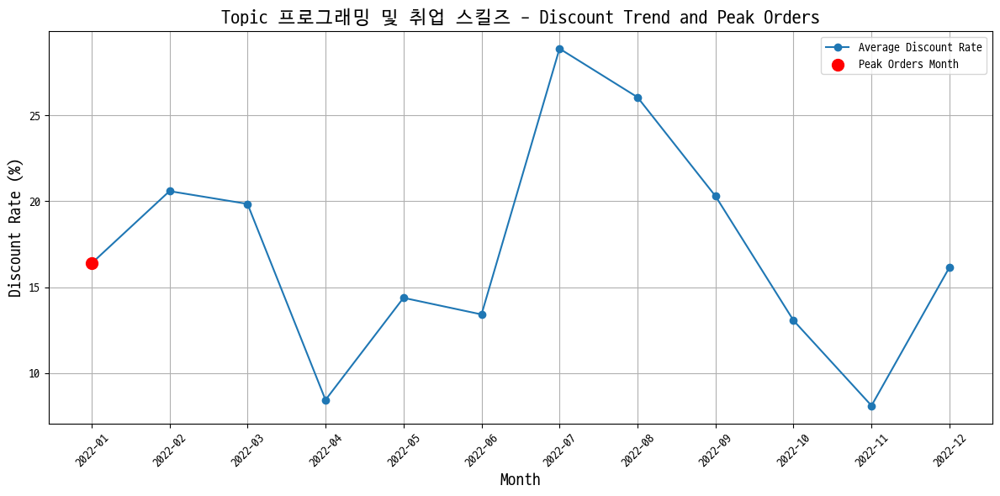

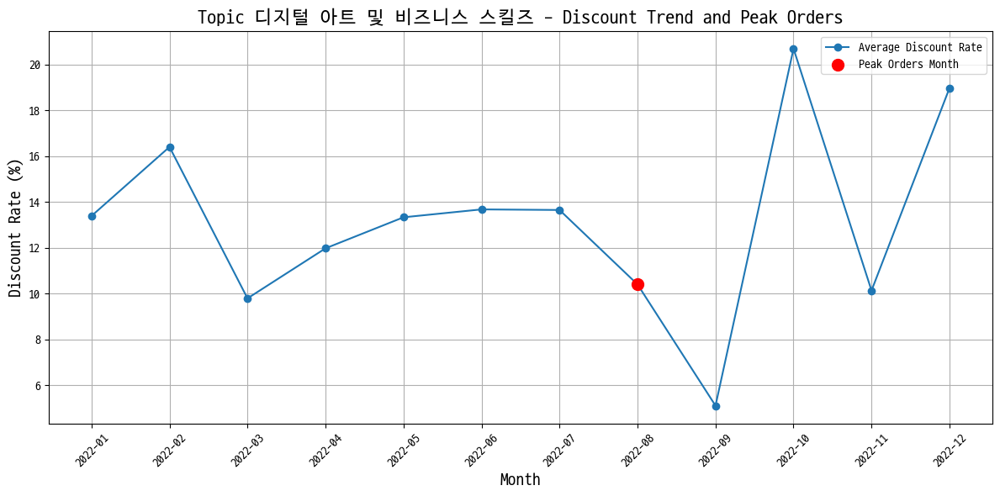

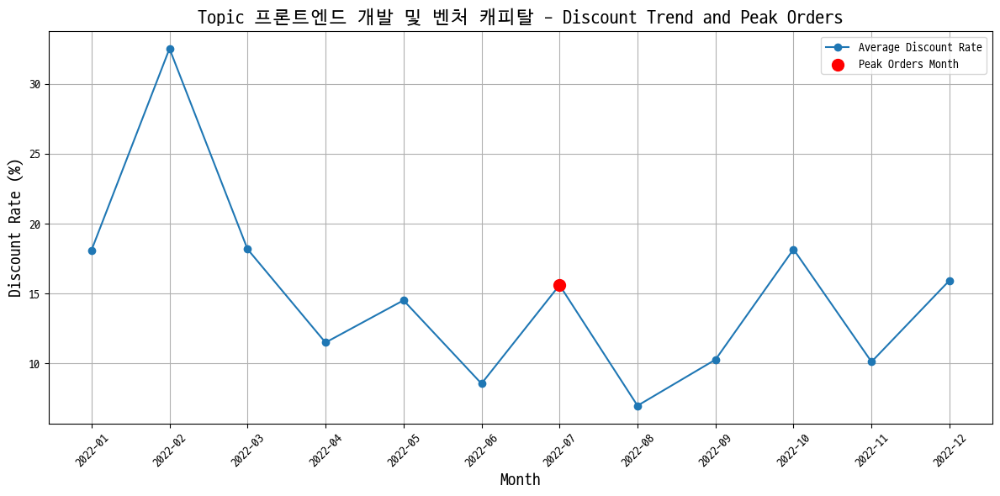

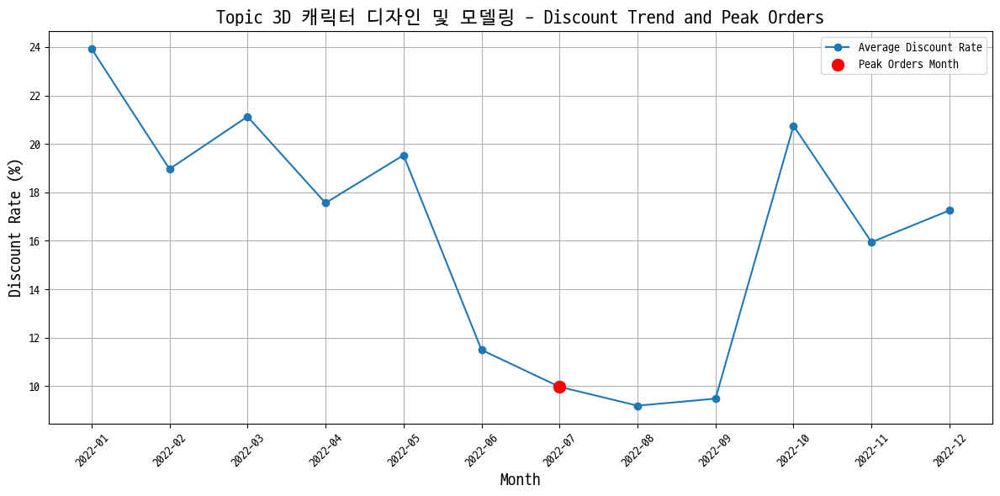

In [150]:
import pandas as pd
import matplotlib.pyplot as plt

# 할인율 계산
yes_df['할인율'] = (1 - yes_df['sale_price'] / yes_df['수업금액']) * 100

# 월별로 데이터 분류
yes_df['월'] = yes_df['결제완료'].dt.to_period('M')

# 토픽별, 월별 할인율 집계
discount_rate_grouped = yes_df.groupby(['dominant_topic', '월'])['할인율'].mean().reset_index()

# 토픽별, 월별 주문 건수 집계
order_count_grouped = yes_df.groupby(['dominant_topic', '월']).size().reset_index(name='주문 건수')

# 최대 주문 건수 월 찾기
max_order_months = order_count_grouped.loc[order_count_grouped.groupby('dominant_topic')['주문 건수'].idxmax()]

# 토픽별로 시각화
for topic in sorted(yes_df['dominant_topic'].unique()):
    topic_discount_data = discount_rate_grouped[discount_rate_grouped['dominant_topic'] == topic]
    topic_order_data = order_count_grouped[order_count_grouped['dominant_topic'] == topic]

    # 피벗 테이블 생성
    pivot_discount = topic_discount_data.pivot(index='월', columns='dominant_topic', values='할인율')
    pivot_orders = topic_order_data.pivot(index='월', columns='dominant_topic', values='주문 건수')

    plt.figure(figsize=(12, 6))
    plt.plot(pivot_discount.index.strftime('%Y-%m'), pivot_discount.values, marker='o', linestyle='-', label='Average Discount Rate')
    
    # 주문 최대치 포인트 강조
    max_month = max_order_months[max_order_months['dominant_topic'] == topic]['월'].values[0]
    max_value = pivot_orders.loc[max_month, topic]
    plt.scatter(max_month.strftime('%Y-%m'), pivot_discount.loc[max_month, topic], color='red', s=100, label='Peak Orders Month', zorder=5)
    
    plt.title(f'Topic {topic_descriptions.get(topic, "Unknown")} - Discount Trend and Peak Orders', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Discount Rate (%)', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## 토픽별 최다 키워드 

In [136]:
import pandas as pd
from collections import Counter

# 키워드 분리 및 소문자 변환 (대소문자 구분 없애기)
yes_df['keywords_list'] = yes_df['keywords'].str.lower().str.split(',')

# 토픽별로 키워드 집계
topic_keywords = yes_df.groupby('dominant_topic')['keywords_list'].agg(sum)

# 각 토픽별 가장 많이 언급된 키워드 추출
top_keywords_per_topic = {}
for topic, keywords in topic_keywords.items():
    keyword_counts = Counter(keywords)
    top_keyword = keyword_counts.most_common(1)[0]  # 가장 많이 등장한 키워드와 그 횟수
    top_keywords_per_topic[topic] = top_keyword

# 결과 출력
for topic, (keyword, count) in top_keywords_per_topic.items():
    topic_label = topic_descriptions.get(topic, f"토픽 {topic}")  # 설명이 없는 경우를 대비
    print(f"{topic_label}: Most common keyword is '{keyword}' mentioned {count} times.")

C:\Users\oh\AppData\Local\Temp\ipykernel_21132\349632237.py:8: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  topic_keywords = yes_df.groupby('dominant_topic')['keywords_list'].agg(sum)


프로젝트 및 데이터 관리: Most common keyword is 'tensorflow' mentioned 4219 times.
비즈니스 커뮤니케이션: Most common keyword is '영상' mentioned 2870 times.
크리에이티브 콘텐츠 제작: Most common keyword is '드로잉' mentioned 13776 times.
데이터 과학: Most common keyword is '머신러닝' mentioned 5719 times.
데이터 시각화 및 분석 입문: Most common keyword is 'aws' mentioned 5037 times.
그래픽 디자인: Most common keyword is '영상' mentioned 4144 times.
금융 및 회계: Most common keyword is '백엔드' mentioned 4042 times.
프론트엔드 개발 및 자바스크립트: Most common keyword is 'backend' mentioned 4019 times.
클라우드 및 데브옵스: Most common keyword is '커리어' mentioned 2185 times.
캐릭터 디자인 및 앱 개발: Most common keyword is '마케팅' mentioned 5038 times.
영상 제작 및 게임 그래픽: Most common keyword is 'ux' mentioned 9891 times.
인공지능 및 딥러닝: Most common keyword is 'frontend' mentioned 4651 times.
데이터 기반 마케팅 및 시각화: Most common keyword is '건축' mentioned 2147 times.
프론트엔드 개발 기초: Most common keyword is '프로그래밍' mentioned 4882 times.
디지털 마케팅 최적화: Most common keyword is '포토샵' mentioned 6563 times.
UI/UX 디자인 및 프

## 토픽별 주중 주말 신청율 시각화

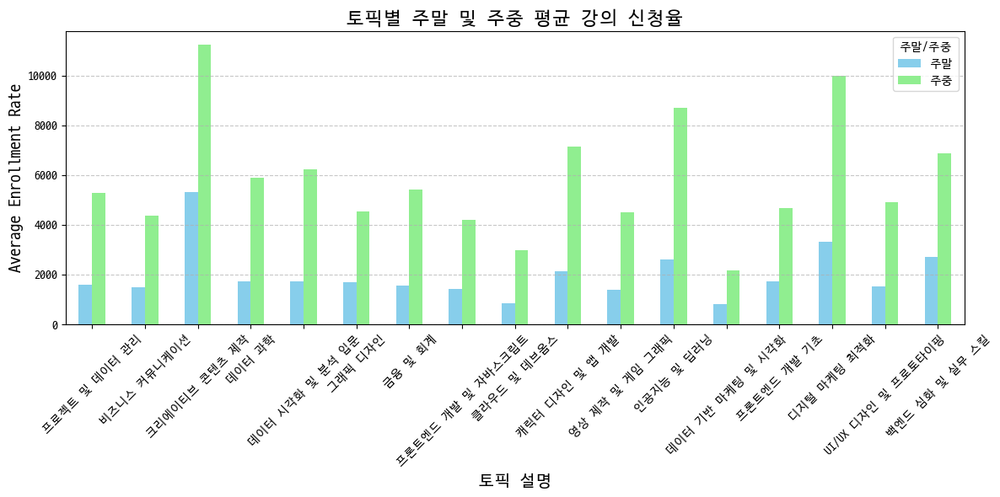

In [137]:
# '결제완료' 컬럼을 datetime으로 변환
yes_df['결제완료'] = pd.to_datetime(yes_df['결제완료'])

# 요일 계산 (0 = Monday, 6 = Sunday)
yes_df['요일'] = yes_df['결제완료'].dt.dayofweek

# 주말과 주중 분류
yes_df['주말_주중'] = yes_df['요일'].apply(lambda x: '주말' if x >= 5 else '주중')

# 토픽별, 주말/주중별 평균 신청율 계산
grouped = yes_df.groupby(['dominant_topic', '주말_주중'])['수업금액'].count().reset_index()

# Pivot table 생성
pivot_data = grouped.pivot_table(index='dominant_topic', columns='주말_주중', values='수업금액')

# 토픽 번호를 토픽 설명으로 변환
pivot_data.index = [topic_descriptions.get(topic, f"토픽 {topic}") for topic in pivot_data.index]

# 시각화
pivot_data.plot(kind='bar', figsize=(12, 6), color=['skyblue', 'lightgreen'])
plt.title('토픽별 주말 및 주중 평균 강의 신청율', fontsize=16)
plt.xlabel('토픽 설명', fontsize=14)
plt.ylabel('Average Enrollment Rate', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='주말/주중')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## 토픽별 요일 판매 파악

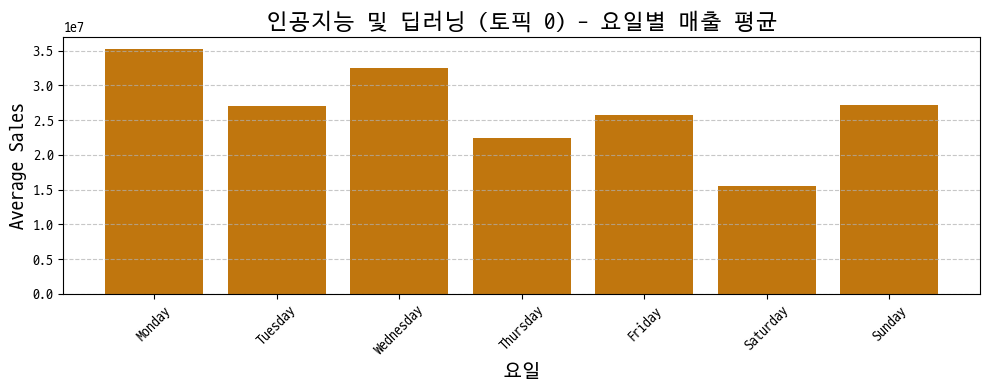

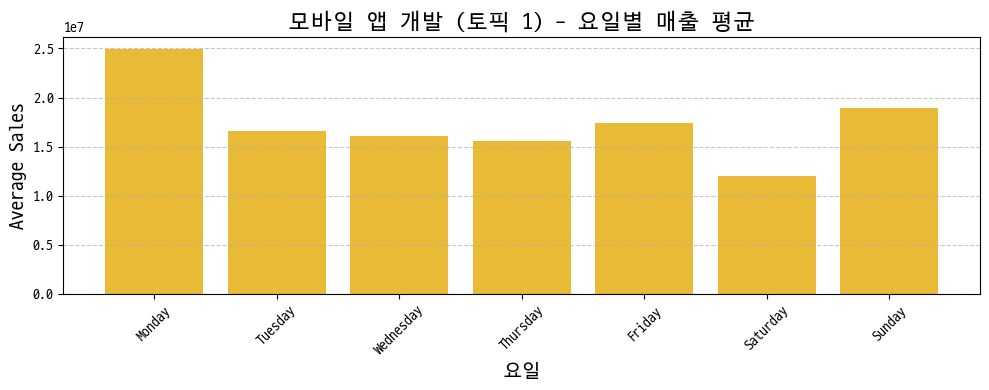

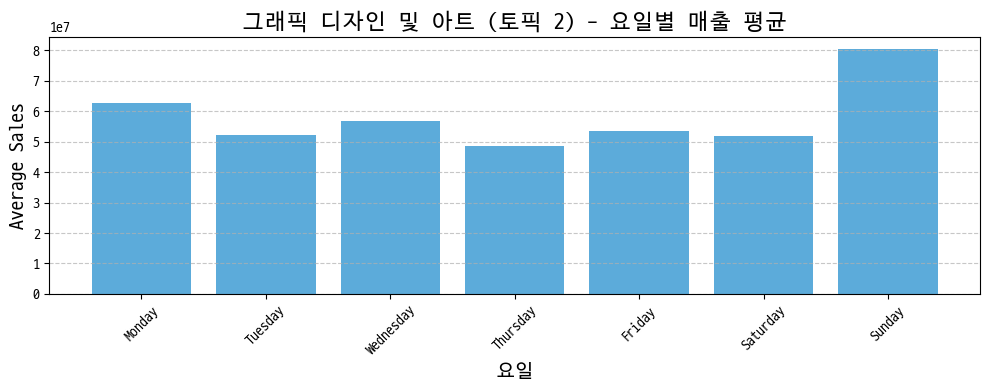

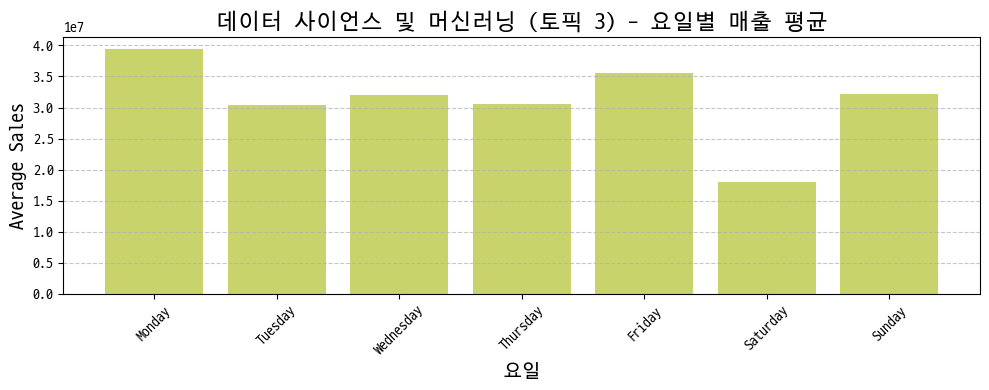

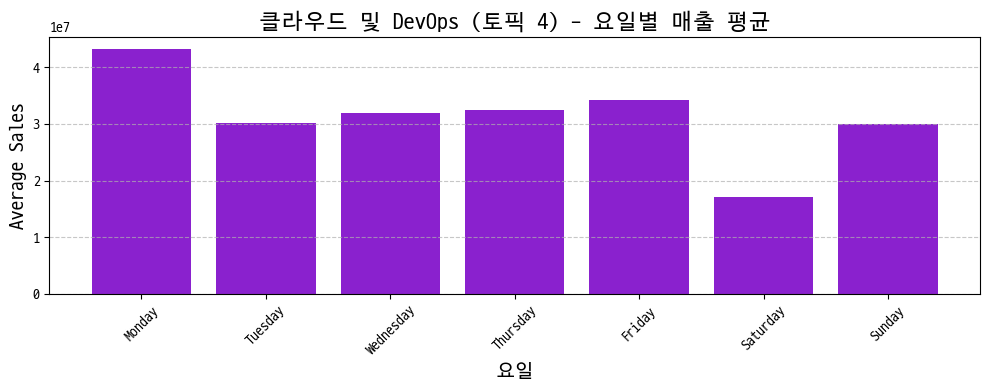

...

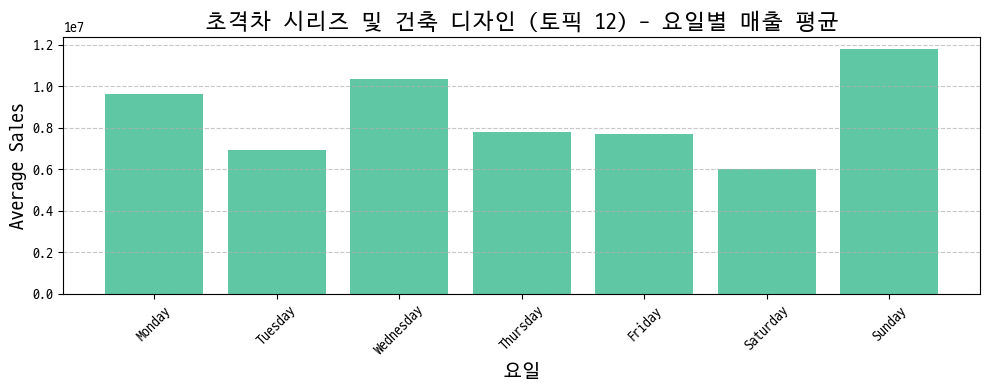

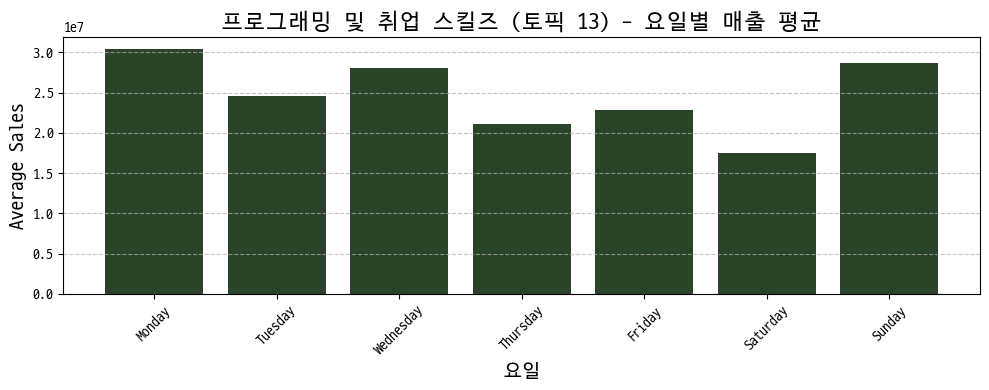

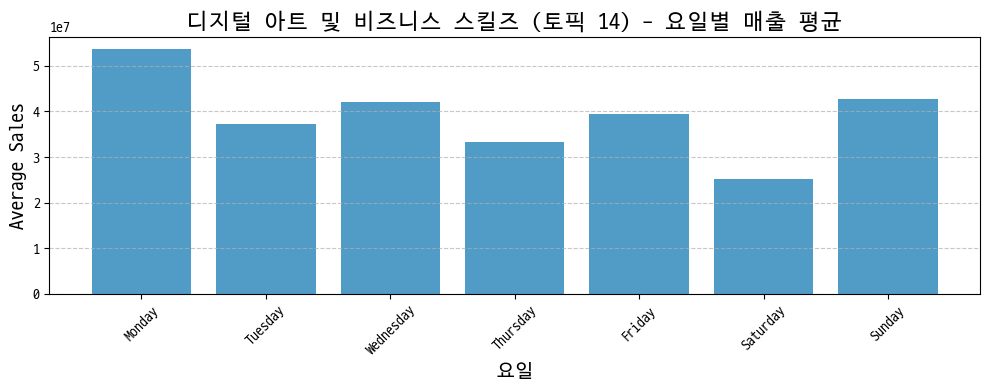

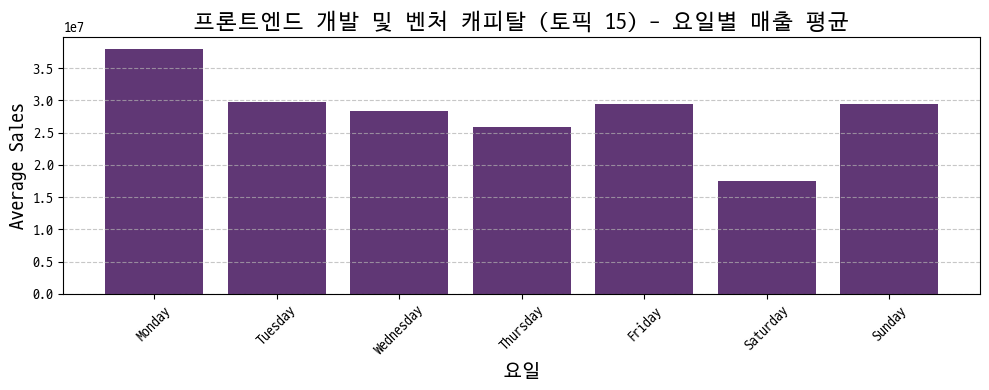

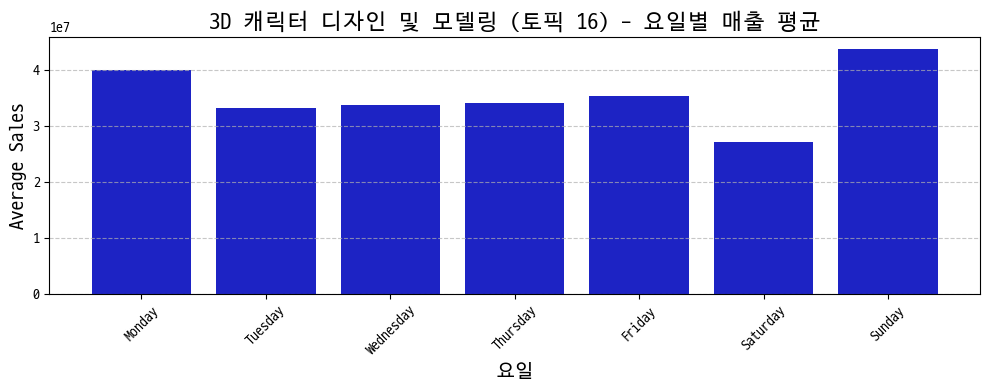

In [153]:
# 요일별로 데이터 분류 (0=월요일, ..., 6=일요일)
yes_df['요일'] = yes_df['결제완료'].dt.dayofweek

# 토픽별, 요일별로 수업 금액을 합하여 집계
grouped = yes_df.groupby(['dominant_topic', '요일'])['수업금액'].sum().reset_index()

# Pivot table 생성하여 요일별 신청 금액을 'dominant_topic'에 따라 정렬
pivot_data = grouped.pivot_table(index='dominant_topic', columns='요일', values='수업금액', fill_value=0)

# 요일별 평균 매출 계산
daily_averages = pivot_data.mean(axis=0)

# 요일 이름 지정
day_names = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# 각 토픽별로 별도의 그래프 그리기
for topic, desc in topic_descriptions.items():
    plt.figure(figsize=(10, 4))
    plt.bar(day_names, pivot_data.loc[topic], color=np.random.rand(3,))  # 각 토픽별 다른 색상
    plt.title(f'{desc} (토픽 {topic}) - 요일별 매출 평균', fontsize=16)
    plt.xlabel('요일', fontsize=14)
    plt.ylabel('Average Sales', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

## 토픽별 강의 가격 도수 분포표

C:\Users\oh\AppData\Local\Temp\ipykernel_21132\234473750.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  price_distribution = yes_df.groupby(['dominant_topic', '가격_구간']).size().unstack(fill_value=0)


가격_구간               10,000원 이하  20,000원  30,000원  40,000원  50,000원  50,000원 초과
프로젝트 및 데이터 관리                0      126     2481     3831      258         170
비즈니스 커뮤니케이션                  0      252     4846      738        0           0
크리에이티브 콘텐츠 제작                0     1092     6884     8571       11           0
데이터 과학                       0      294     3632     1539     1722         413
데이터 시각화 및 분석 입문              0      106     4755      547     2392         183
그래픽 디자인                      0      338     3535     1637      539         197
금융 및 회계                      0      172     3281     1677     1727          98
프론트엔드 개발 및 자바스크립트            0        0     3134     2371        0         104
클라우드 및 데브옵스                  0      890     2726      203        0           0
캐릭터 디자인 및 앱 개발               0      442     4701     3157      958           0
영상 제작 및 게임 그래픽               0      120      240     5183      339           0
인공지능 및 딥러닝                   0      520     2532    

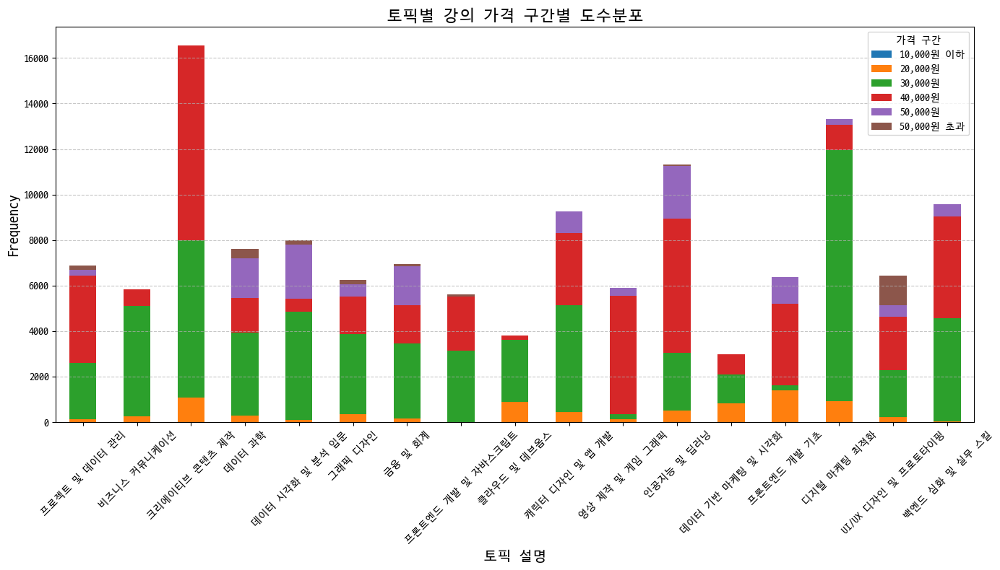

In [139]:
import pandas as pd
import matplotlib.pyplot as plt

# 가격 구간 정의
bins = [0, 10000, 20000, 30000, 40000, 50000, float('inf')]
labels = ['10,000원 이하', '20,000원', '30,000원', '40,000원', '50,000원', '50,000원 초과']

# 가격 구간별로 데이터 분류
yes_df['가격_구간'] = pd.cut(yes_df['수업금액'], bins=bins, labels=labels, right=False)

# 토픽별, 가격 구간별 도수분포 계산
price_distribution = yes_df.groupby(['dominant_topic', '가격_구간']).size().unstack(fill_value=0)

# 토픽 번호를 토픽 설명으로 변환
price_distribution.index = [topic_descriptions.get(int(topic), f"토픽 {topic}") for topic in price_distribution.index]

# 도수분포표 출력
print(price_distribution)

# 시각화
price_distribution.plot(kind='bar', figsize=(14, 8), stacked=True)
plt.title('토픽별 강의 가격 구간별 도수분포', fontsize=16)
plt.xlabel('토픽 설명', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='가격 구간')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [140]:
yes_df.columns

Index(['order_id', 'order_state', 'title', '결제완료', 'customer_id', '수업금액',
       'sale_price', '할인', '최근 결제일', 'user_id', '계정 생성 날짜', '최근 접속일', 'id',
       'created_at', 'description', 'total_class_hours', 'keywords', '월',
       'dominant_topic', '토픽 설명', '일', '시간', '할인율', 'keywords_list', '요일',
       '주말_주중', '가격_구간', '시리즈'],
      dtype='object')